In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sys

"""
2.5D Constrained Transport Magnetohydrodynamics
Philip Mocz, @PMocz
Adam Reyes
(2024)

Simulate the Orszag-Tang vortex MHD problem (+more)
with a Boris-like Integrator to control timesteps!

See equations (1) -- (8) of https://arxiv.org/abs/1902.02810

MAIN DIFFERENCE is that:

* Momentum is now (1 + ca^2/c_limit^2) * (rho*v) instead of (rho*v)
* Reimann solver will use modified wave speeds and U states that account for Boris factor
* Timestep is increased according to the Boris factor

* NOTE: use llf for now, not HLLD, which does not yet account for modified wave speeds

I mark points of change from vanilla-MHD model with "!!!" in comments.

The original problem has cf_max ~ 1.9, v_max ~ 1.6
"""

# Simulation parameters (global)
N = 128  # resolution
use_slope_limiting = True
riemann_solver = "llf"

# directions for np.roll()
#  -1    right/up
#   1    left/down


def get_curl(Az, dx):
    """
    Calculate the discrete curl
    Az       is matrix of nodal z-component of magnetic potential
    dx       is the cell size
    bx       is matrix of cell face x-component magnetic-field
    by       is matrix of cell face y-component magnetic-field
    """

    bx = (Az - np.roll(Az, 1, axis=1)) / dx  # = d Az / d y
    by = -(Az - np.roll(Az, 1, axis=0)) / dx  # =-d Az / d x

    return bx, by


def get_div(bx, by, dx):
    """
    Calculate the discrete curl of each cell
    dx       is the cell size
    bx       is matrix of cell face x-component magnetic-field
    by       is matrix of cell face y-component magnetic-field
    """

    divB = (bx - np.roll(bx, 1, axis=0) + by - np.roll(by, 1, axis=1)) / dx

    return divB


def get_avg(bx, by):
    """
    Calculate the volume-averaged magnetic field
    bx       is matrix of cell face x-component magnetic-field
    by       is matrix of cell face y-component magnetic-field
    Bx       is matrix of cell Bx
    By       is matrix of cell By
    """

    Bx = 0.5 * (bx + np.roll(bx, 1, axis=0))
    By = 0.5 * (by + np.roll(by, 1, axis=1))

    return Bx, By


def get_conserved(rho, vx, vy, vz, P, Bx, By, Bz, gamma, vol, c_limit):
    """
    Calculate the conserved variable from the primitive
    rho      is matrix of cell densities
    vx       is matrix of cell x-velocity
    vy       is matrix of cell y-velocity
    P        is matrix of cell Total pressures
    Bx       is matrix of cell Bx
    By       is matrix of cell By
    gamma    is ideal gas gamma
    vol      is cell volume
    Mass     is matrix of mass in cells
    Momx     is matrix of x-momentum in cells
    Momy     is matrix of y-momentum in cells
    Energy   is matrix of energy in cells
    """
    rho_A = (Bx**2 + By**2 + Bz**2) / c_limit**2  # !!!
    Mass = rho * vol
    Momx = (rho + rho_A) * vx * vol
    Momy = (rho + rho_A) * vy * vol
    Momz = (rho + rho_A) * vz * vol
    Energy = (
        (P - 0.5 * (Bx**2 + By**2 + Bz**2)) / (gamma - 1.0)
        + 0.5 * rho * (vx**2 + vy**2 + vz**2)
        + 0.5 * (Bx**2 + By**2 + Bz**2)
    ) * vol

    return Mass, Momx, Momy, Momz, Energy


def get_primitive(Mass, Momx, Momy, Momz, Energy, Bx, By, Bz, gamma, vol, c_limit):
    """
    Calculate the primitive variable from the conservative
    Mass     is matrix of mass in cells
    Momx     is matrix of x-momentum in cells
    Momy     is matrix of y-momentum in cells
    Energy   is matrix of energy in cells
    Bx       is matrix of cell Bx
    By       is matrix of cell By
    gamma    is ideal gas gamma
    vol      is cell volume
    rho      is matrix of cell densities
    vx       is matrix of cell x-velocity
    vy       is matrix of cell y-velocity
    P        is matrix of cell Total pressures
    """
    rho = Mass / vol
    rho_A = (Bx**2 + By**2 + Bz**2) / c_limit**2  # !!!
    vx = Momx / (rho + rho_A) / vol
    vy = Momy / (rho + rho_A) / vol
    vz = Momz / (rho + rho_A) / vol
    P = (
        Energy / vol
        - 0.5 * rho * (vx**2 + vy**2 + vz**2)
        - 0.5 * (Bx**2 + By**2 + Bz**2)
    ) * (gamma - 1.0) + 0.5 * (Bx**2 + By**2 + Bz**2)

    return rho, vx, vy, vz, P


def get_gradient(f, dx):
    """
    Calculate the gradients of a field
    f        is a matrix of the field
    dx       is the cell size
    f_dx     is a matrix of derivative of f in the x-direction
    f_dy     is a matrix of derivative of f in the y-direction
    """

    f_dx = (np.roll(f, -1, axis=0) - np.roll(f, 1, axis=0)) / (2.0 * dx)
    f_dy = (np.roll(f, -1, axis=1) - np.roll(f, 1, axis=1)) / (2.0 * dx)

    return f_dx, f_dy


def slope_limit(f, dx, f_dx, f_dy):
    """
    Apply slope limiter to slopes
    f        is a matrix of the field
    dx       is the cell size
    f_dx     is a matrix of derivative of f in the x-direction
    f_dy     is a matrix of derivative of f in the y-direction
    """

    f_dx = (
        np.maximum(
            0.0,
            np.minimum(
                1.0, ((f - np.roll(f, 1, axis=0)) / dx) / (f_dx + 1.0e-8 * (f_dx == 0))
            ),
        )
        * f_dx
    )
    f_dx = (
        np.maximum(
            0.0,
            np.minimum(
                1.0,
                (-(f - np.roll(f, -1, axis=0)) / dx) / (f_dx + 1.0e-8 * (f_dx == 0)),
            ),
        )
        * f_dx
    )
    f_dy = (
        np.maximum(
            0.0,
            np.minimum(
                1.0, ((f - np.roll(f, 1, axis=1)) / dx) / (f_dy + 1.0e-8 * (f_dy == 0))
            ),
        )
        * f_dy
    )
    f_dy = (
        np.maximum(
            0.0,
            np.minimum(
                1.0,
                (-(f - np.roll(f, -1, axis=1)) / dx) / (f_dy + 1.0e-8 * (f_dy == 0)),
            ),
        )
        * f_dy
    )

    return f_dx, f_dy


def extrapolate_in_space_to_face(f, f_dx, f_dy, dx):
    """
    Calculate the gradients of a field
    f        is a matrix of the field
    f_dx     is a matrix of the field x-derivatives
    f_dy     is a matrix of the field y-derivatives
    dx       is the cell size
    f_XL     is a matrix of spatial-extrapolated values on `left' face along x-axis
    f_XR     is a matrix of spatial-extrapolated values on `right' face along x-axis
    f_YL     is a matrix of spatial-extrapolated values on `left' face along y-axis
    f_YR     is a matrix of spatial-extrapolated values on `right' face along y-axis
    """

    f_XL = f - f_dx * dx / 2.0
    f_XL = np.roll(f_XL, -1, axis=0)
    f_XR = f + f_dx * dx / 2.0

    f_YL = f - f_dy * dx / 2.0
    f_YL = np.roll(f_YL, -1, axis=1)
    f_YR = f + f_dy * dx / 2.0

    return f_XL, f_XR, f_YL, f_YR


def dudt_fluxes(flux_X, flux_Y, dx):
    F = -dx * flux_X
    F += dx * np.roll(flux_X, 1, axis=0)
    F += -dx * flux_Y
    F += dx * np.roll(flux_Y, 1, axis=1)
    return F


def dudt_stokes(flux_By_X, flux_Bx_Y, dx):
    # Ez at top right node of cell = avg of 4 fluxes
    Ez = 0.25 * (
        -flux_By_X
        - np.roll(flux_By_X, -1, axis=1)
        + flux_Bx_Y
        + np.roll(flux_Bx_Y, -1, axis=0)
    )
    dbx, dby = get_curl(-Ez, dx)

    return dbx, dby


def apply_dudt(F, dudt, dt):
    return F + dt * dudt


# HLLD (adapted from Athena)
def get_flux_hlld(
    rho_L,
    rho_R,
    vx_L,
    vx_R,
    vy_L,
    vy_R,
    vz_L,
    vz_R,
    P_L,
    P_R,
    Bx_L,
    Bx_R,
    By_L,
    By_R,
    Bz_L,
    Bz_R,
    gamma,
    c_limit,
):
    """
    Calculate fluxes between 2 states with local Lax-Friedrichs/Rusanov rule
    rho_L        is a matrix of left-state  density
    rho_R        is a matrix of right-state density
    vx_L         is a matrix of left-state  x-velocity
    vx_R         is a matrix of right-state x-velocity
    vy_L         is a matrix of left-state  y-velocity
    vy_R         is a matrix of right-state y-velocity
    P_L          is a matrix of left-state  Total pressure
    P_R          is a matrix of right-state Total pressure
    Bx_L         is a matrix of left-state  x-magnetic-field
    Bx_R         is a matrix of right-state x-magnetic-field
    By_L         is a matrix of left-state  y-magnetic-field
    By_R         is a matrix of right-state y-magnetic-field
    gamma        is the ideal gas gamma
    flux_Mass    is the matrix of mass fluxes
    flux_Momx    is the matrix of x-momentum fluxes
    flux_Momy    is the matrix of y-momentum fluxes
    flux_Energy  is the matrix of energy fluxes
    """

    SMALL_NUMBER = 1.0e-8

    P_L -= 0.5 * (Bx_L**2 + By_L**2 + Bz_L**2)
    P_R -= 0.5 * (Bx_R**2 + By_R**2 + Bz_R**2)

    Bxi = 0.5 * (Bx_L + Bx_R)

    Mx_L = rho_L * vx_L
    My_L = rho_L * vy_L
    Mz_L = rho_L * vz_L
    E_L = (
        P_L / (gamma - 1.0)
        + 0.5 * rho_L * (vx_L**2 + vy_L**2 + vz_L**2)
        + 0.5 * (Bx_L**2 + By_L**2 + Bz_L**2)
    )

    Mx_R = rho_R * vx_R
    My_R = rho_R * vy_R
    Mz_R = rho_R * vz_R
    E_R = (
        P_R / (gamma - 1.0)
        + 0.5 * rho_R * (vx_R**2 + vy_R**2 + vz_R**2)
        + 0.5 * (Bx_R**2 + By_R**2 + Bz_R**2)
    )

    # --- Step 2. ------------------------------------------------------------------
    #  Compute left & right wave speeds according to Miyoshi & Kusano, eqn. (67)
    #

    pbl = 0.5 * (Bxi**2 + By_L**2 + Bz_L**2)
    pbr = 0.5 * (Bxi**2 + By_R**2 + Bz_R**2)
    gpl = gamma * P_L
    gpr = gamma * P_R
    gpbl = gpl + 2.0 * pbl
    gpbr = gpr + 2.0 * pbr

    Bxsq = Bxi**2
    cfl = np.sqrt((gpbl + np.sqrt(gpbl**2 - 4.0 * gpl * Bxsq)) / (2.0 * rho_L))
    cfr = np.sqrt((gpbr + np.sqrt(gpbr**2 - 4.0 * gpr * Bxsq)) / (2.0 * rho_R))
    cfmax = np.maximum(cfl, cfr)

    spd1 = (vx_L - cfmax) * (vx_L <= vx_R) + (vx_R - cfmax) * (vx_L > vx_R)
    spd5 = (vx_R + cfmax) * (vx_L <= vx_R) + (vx_L + cfmax) * (vx_L > vx_R)

    # --- Step 3. ------------------------------------------------------------------
    # Compute L/R fluxes
    #

    # total pressure
    ptl = P_L + pbl
    ptr = P_R + pbr

    FL_d = Mx_L
    FL_Mx = Mx_L * vx_L + ptl - Bxsq
    FL_My = rho_L * vx_L * vy_L - Bxi * By_L
    FL_Mz = rho_L * vx_L * vz_L - Bxi * Bz_L
    FL_E = vx_L * (E_L + ptl - Bxsq) - Bxi * (vy_L * By_L + vz_L * Bz_L)
    FL_By = By_L * vx_L - Bxi * vy_L
    FL_Bz = Bz_L * vx_L - Bxi * vz_L
    FR_d = Mx_R
    FR_Mx = Mx_R * vx_R + ptr - Bxsq
    FR_My = rho_R * vx_R * vy_R - Bxi * By_R
    FR_Mz = rho_R * vx_R * vz_R - Bxi * Bz_R
    FR_E = vx_R * (E_R + ptr - Bxsq) - Bxi * (vy_R * By_R + vz_R * Bz_R)
    FR_By = By_R * vx_R - Bxi * vy_R
    FR_Bz = Bz_R * vx_R - Bxi * vz_R

    # --- Step 4. ------------------------------------------------------------------
    #  Return upwind flux if flow is supersonic
    #

    # deferred to the end

    # --- Step 5. ------------------------------------------------------------------
    #  Compute middle and Alfven wave speeds
    #

    sdl = spd1 - vx_L
    sdr = spd5 - vx_R

    # S_M: eqn (38) of Miyoshi & Kusano
    spd3 = (sdr * rho_R * vx_R - sdl * rho_L * vx_L - ptr + ptl) / (
        sdr * rho_R - sdl * rho_L
    )

    sdml = spd1 - spd3
    sdmr = spd5 - spd3
    # eqn (43) of Miyoshi & Kusano
    ULst_d = rho_L * sdl / sdml
    URst_d = rho_R * sdr / sdmr
    sqrtdl = np.sqrt(ULst_d)
    sqrtdr = np.sqrt(URst_d)

    # eqn (51) of Miyoshi & Kusano
    spd2 = spd3 - np.abs(Bxi) / sqrtdl
    spd4 = spd3 + np.abs(Bxi) / sqrtdr

    # --- Step 6. ------------------------------------------------------------------
    # Compute intermediate states
    #

    ptst = ptl + rho_L * sdl * (sdl - sdml)

    # Ul*
    # eqn (39) of M&K
    ULst_Mx = ULst_d * spd3
    # ULst_Bx = Bxi
    isDegen = np.abs(rho_L * sdl * sdml / Bxsq - 1.0) < SMALL_NUMBER

    # eqns (44) and (46) of M&K
    tmp = Bxi * (sdl - sdml) / (rho_L * sdl * sdml - Bxsq)
    ULst_My = (ULst_d * vy_L) * isDegen + (ULst_d * (vy_L - By_L * tmp)) * (~isDegen)
    ULst_Mz = (ULst_d * vz_L) * isDegen + (ULst_d * (vz_L - Bz_L * tmp)) * (~isDegen)

    # eqns (45) and (47) of M&K
    tmp = (rho_L * (sdl) ** 2 - Bxsq) / (rho_L * sdl * sdml - Bxsq)
    ULst_By = (By_L) * isDegen + (By_L * tmp) * (~isDegen)
    ULst_Bz = (Bz_L) * isDegen + (Bz_L * tmp) * (~isDegen)

    vbstl = (ULst_Mx * Bxi + ULst_My * ULst_By + ULst_Mz * ULst_Bz) / ULst_d
    # eqn (48) of M&K#
    ULst_E = (
        sdl * E_L
        - ptl * vx_L
        + ptst * spd3
        + Bxi * (vx_L * Bxi + vy_L * By_L + vz_L * Bz_L - vbstl)
    ) / sdml
    # WLst_d = ULst_d
    # WLst_vx = ULst_Mx / ULst_d
    WLst_vy = ULst_My / ULst_d
    WLst_vz = ULst_Mz / ULst_d
    # WLst_Bx = ULst_Bx
    # WLst_By = ULst_By
    # WLst_Bz = ULst_Bz
    # WLst_P = (gamma - 1.0) * (
    #    ULst_E
    #    - 0.5 * WLst_d * (WLst_vx**2 + WLst_vy**2 + WLst_vz**2)
    #    - 0.5 * (WLst_Bx**2 + WLst_By**2 + WLst_Bz**2)
    # )

    # Ur*
    # eqn (39) of M&K
    URst_Mx = URst_d * spd3
    # URst_Bx = Bxi
    isDegen = np.abs(rho_R * sdr * sdmr / Bxsq - 1.0) < SMALL_NUMBER

    # eqns (44) and (46) of M&K
    tmp = Bxi * (sdr - sdmr) / (rho_R * sdr * sdmr - Bxsq)
    URst_My = (URst_d * vy_R) * isDegen + (URst_d * (vy_R - By_R * tmp)) * (~isDegen)
    URst_Mz = (URst_d * vz_R) * isDegen + (URst_d * (vz_R - Bz_R * tmp)) * (~isDegen)

    # eqns (45) and (47) of M&K
    tmp = (rho_R * (sdr) ** 2 - Bxsq) / (rho_R * sdr * sdmr - Bxsq)
    URst_By = (By_R) * isDegen + (By_R * tmp) * (~isDegen)
    URst_Bz = (Bz_R) * isDegen + (Bz_R * tmp) * (~isDegen)

    vbstr = (URst_Mx * Bxi + URst_My * URst_By + URst_Mz * URst_Bz) / URst_d
    # eqn (48) of M&K
    URst_E = (
        sdr * E_R
        - ptr * vx_R
        + ptst * spd3
        + Bxi * (vx_R * Bxi + vy_R * By_R + vz_R * Bz_R - vbstr)
    ) / sdmr
    # WRst_d = URst_d
    # WRst_vx = URst_Mx / URst_d
    WRst_vy = URst_My / URst_d
    WRst_vz = URst_Mz / URst_d
    # WRst_Bx = URst_Bx
    # WRst_By = URst_By
    # WRst_Bz = URst_Bz
    # WRst_P = (gamma - 1) * (
    #    URst_E
    #    - 0.5 * WRst_d * (WRst_vx**2 + WRst_vy**2 + WRst_vz**2)
    #    - 0.5 * (WRst_Bx**2 + WRst_By**2 + WRst_Bz**2)
    # )

    # Ul**  and Ur**  - if Bx is zero, same as  * -states
    #   if(Bxi == 0.0)
    isDegen = 0.5 * Bxsq / np.minimum(pbl, pbr) < (SMALL_NUMBER) ** 2
    ULdst_d = ULst_d * isDegen
    ULdst_Mx = ULst_Mx * isDegen
    ULdst_My = ULst_My * isDegen
    ULdst_Mz = ULst_Mz * isDegen
    ULdst_By = ULst_By * isDegen
    ULdst_Bz = ULst_Bz * isDegen
    ULdst_E = ULst_E * isDegen

    URdst_d = URst_d * isDegen
    URdst_Mx = URst_Mx * isDegen
    URdst_My = URst_My * isDegen
    URdst_Mz = URst_Mz * isDegen
    URdst_By = URst_By * isDegen
    URdst_Bz = URst_Bz * isDegen
    URdst_E = URst_E * isDegen

    # else
    invsumd = 1.0 / (sqrtdl + sqrtdr)
    Bxsig = 0 * Bxi - 1
    Bxsig[Bxi > 0] = 1

    ULdst_d = ULdst_d + ULst_d * (~isDegen)
    URdst_d = URdst_d + URst_d * (~isDegen)

    ULdst_Mx = ULdst_Mx + ULst_Mx * (~isDegen)
    URdst_Mx = URdst_Mx + URst_Mx * (~isDegen)

    # eqn (59) of M&K
    tmp = invsumd * (sqrtdl * WLst_vy + sqrtdr * WRst_vy + Bxsig * (URst_By - ULst_By))
    ULdst_My = ULdst_My + ULdst_d * tmp * (~isDegen)
    URdst_My = URdst_My + URdst_d * tmp * (~isDegen)

    # eqn (60) of M&K
    tmp = invsumd * (sqrtdl * WLst_vz + sqrtdr * WRst_vz + Bxsig * (URst_Bz - ULst_Bz))
    ULdst_Mz = ULdst_Mz + ULdst_d * tmp * (~isDegen)
    URdst_Mz = URdst_Mz + URdst_d * tmp * (~isDegen)

    # eqn (61) of M&K
    tmp = invsumd * (
        sqrtdl * URst_By
        + sqrtdr * ULst_By
        + Bxsig * sqrtdl * sqrtdr * (WRst_vy - WLst_vy)
    )
    ULdst_By = ULdst_By + tmp * (~isDegen)
    URdst_By = URdst_By + tmp * (~isDegen)

    # eqn (62) of M&K
    tmp = invsumd * (
        sqrtdl * URst_Bz
        + sqrtdr * ULst_Bz
        + Bxsig * sqrtdl * sqrtdr * (WRst_vz - WLst_vz)
    )
    ULdst_Bz = ULdst_Bz + tmp * (~isDegen)
    URdst_Bz = URdst_Bz + tmp * (~isDegen)

    # eqn (63) of M&K
    tmp = spd3 * Bxi + (ULdst_My * ULdst_By + ULdst_Mz * ULdst_Bz) / ULdst_d
    ULdst_E = ULdst_E + (ULst_E - sqrtdl * Bxsig * (vbstl - tmp)) * (~isDegen)
    URdst_E = URdst_E + (URst_E + sqrtdr * Bxsig * (vbstr - tmp)) * (~isDegen)

    # --- Step 7. ------------------------------------------------------------------
    #  Compute flux
    #

    flux_Mass = FL_d * (spd1 >= 0)
    flux_Momx = FL_Mx * (spd1 >= 0)
    flux_Momy = FL_My * (spd1 >= 0)
    flux_Momz = FL_Mz * (spd1 >= 0)
    flux_Energy = FL_E * (spd1 >= 0)
    flux_By = FL_By * (spd1 >= 0)
    flux_Bz = FL_Bz * (spd1 >= 0)

    flux_Mass += FR_d * (spd5 <= 0)
    flux_Momx += FR_Mx * (spd5 <= 0)
    flux_Momy += FR_My * (spd5 <= 0)
    flux_Momz += FR_Mz * (spd5 <= 0)
    flux_Energy += FR_E * (spd5 <= 0)
    flux_By += FR_By * (spd5 <= 0)
    flux_Bz += FR_Bz * (spd5 <= 0)

    # if(spd2 >= 0)
    # return Fl * #
    flux_Mass += (FL_d + spd1 * (ULst_d - rho_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_Momx += (FL_Mx + spd1 * (ULst_Mx - Mx_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_Momy += (FL_My + spd1 * (ULst_My - My_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_Momz += (FL_Mz + spd1 * (ULst_Mz - Mz_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_Energy += (FL_E + spd1 * (ULst_E - E_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_By += (FL_By + spd1 * (ULst_By - By_L)) * ((spd1 < 0) & (spd2 >= 0))
    flux_Bz += (FL_Bz + spd1 * (ULst_Bz - Bz_L)) * ((spd1 < 0) & (spd2 >= 0))

    # elseif(spd3 >= 0)
    # return Fl *  *
    tmp = spd2 - spd1
    flux_Mass += (FL_d - spd1 * rho_L - tmp * ULst_d + spd2 * ULdst_d) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_Momx += (FL_Mx - spd1 * Mx_L - tmp * ULst_Mx + spd2 * ULdst_Mx) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_Momy += (FL_My - spd1 * My_L - tmp * ULst_My + spd2 * ULdst_My) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_Momz += (FL_Mz - spd1 * Mz_L - tmp * ULst_Mz + spd2 * ULdst_Mz) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_Energy += (FL_E - spd1 * E_L - tmp * ULst_E + spd2 * ULdst_E) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_By += (FL_By - spd1 * By_L - tmp * ULst_By + spd2 * ULdst_By) * (
        (spd2 < 0) & (spd3 >= 0)
    )
    flux_Bz += (FL_Bz - spd1 * Bz_L - tmp * ULst_Bz + spd2 * ULdst_Bz) * (
        (spd2 < 0) & (spd3 >= 0)
    )

    # elseif(spd4 > 0)
    # return Fr *  *
    tmp = spd4 - spd5
    flux_Mass += (FR_d - spd5 * rho_R - tmp * URst_d + spd4 * URdst_d) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_Momx += (FR_Mx - spd5 * Mx_R - tmp * URst_Mx + spd4 * URdst_Mx) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_Momy += (FR_My - spd5 * My_R - tmp * URst_My + spd4 * URdst_My) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_Momz += (FR_Mz - spd5 * Mz_R - tmp * URst_Mz + spd4 * URdst_Mz) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_Energy += (FR_E - spd5 * E_R - tmp * URst_E + spd4 * URdst_E) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_By += (FR_By - spd5 * By_R - tmp * URst_By + spd4 * URdst_By) * (
        (spd3 < 0) & (spd4 > 0)
    )
    flux_Bz += (FR_Bz - spd5 * Bz_R - tmp * URst_Bz + spd4 * URdst_Bz) * (
        (spd3 < 0) & (spd4 > 0)
    )

    # else
    # return Fr *
    flux_Mass += (FR_d + spd5 * (URst_d - rho_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_Momx += (FR_Mx + spd5 * (URst_Mx - Mx_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_Momy += (FR_My + spd5 * (URst_My - My_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_Momz += (FR_Mz + spd5 * (URst_Mz - Mz_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_Energy += (FR_E + spd5 * (URst_E - E_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_By += (FR_By + spd5 * (URst_By - By_R)) * ((spd4 <= 0) & (spd5 > 0))
    flux_Bz += (FR_Bz + spd5 * (URst_Bz - Bz_R)) * ((spd4 <= 0) & (spd5 > 0))

    return flux_Mass, flux_Momx, flux_Momy, flux_Momz, flux_Energy, flux_By, flux_Bz


# local Lax-Friedrichs/Rusanov
def get_flux_llf(
    rho_L,
    rho_R,
    vx_L,
    vx_R,
    vy_L,
    vy_R,
    vz_L,
    vz_R,
    P_L,
    P_R,
    Bx_L,
    Bx_R,
    By_L,
    By_R,
    Bz_L,
    Bz_R,
    gamma,
    c_limit,
):
    """
    Calculate fluxes between 2 states with local Lax-Friedrichs/Rusanov rule
    rho_L        is a matrix of left-state  density
    rho_R        is a matrix of right-state density
    vx_L         is a matrix of left-state  x-velocity
    vx_R         is a matrix of right-state x-velocity
    vy_L         is a matrix of left-state  y-velocity
    vy_R         is a matrix of right-state y-velocity
    P_L          is a matrix of left-state  Total pressure
    P_R          is a matrix of right-state Total pressure
    Bx_L         is a matrix of left-state  x-magnetic-field
    Bx_R         is a matrix of right-state x-magnetic-field
    By_L         is a matrix of left-state  y-magnetic-field
    By_R         is a matrix of right-state y-magnetic-field
    gamma        is the ideal gas gamma
    flux_Mass    is the matrix of mass fluxes
    flux_Momx    is the matrix of x-momentum fluxes
    flux_Momy    is the matrix of y-momentum fluxes
    flux_Energy  is the matrix of energy fluxes
    """

    # find wavespeeds
    # c0_L = np.sqrt( gamma*(P_L-0.5*(Bx_L**2+By_L**2+Bz_L**2))/rho_L )
    # c0_R = np.sqrt( gamma*(P_R-0.5*(Bx_R**2+By_R**2+Bz_R**2))/rho_R )
    c0_L = np.sqrt(
        gamma * (np.maximum(P_L - 0.5 * (Bx_L**2 + By_L**2 + Bz_L**2), 1.0e-16)) / rho_L
    )
    c0_R = np.sqrt(
        gamma * (np.maximum(P_R - 0.5 * (Bx_R**2 + By_R**2 + Bz_R**2), 1.0e-16)) / rho_R
    )
    ca_L = np.sqrt((Bx_L**2 + By_L**2 + Bz_L**2) / rho_L)
    ca_R = np.sqrt((Bx_R**2 + By_R**2 + Bz_R**2) / rho_R)
    cf_L = np.sqrt(c0_L**2 + ca_L**2)
    cf_R = np.sqrt(c0_R**2 + ca_R**2)
    # !!! apply boris factor to wave speeds
    alpha_L = 1.0 / np.sqrt(1.0 + (ca_L / c_limit) ** 2)
    alpha_R = 1.0 / np.sqrt(1.0 + (ca_R / c_limit) ** 2)
    cf_L *= alpha_L
    cf_R *= alpha_R

    # left and right energies
    en_L = (
        (P_L - 0.5 * (Bx_L**2 + By_L**2 + Bz_L**2)) / (gamma - 1.0)
        + 0.5 * rho_L * (vx_L**2 + vy_L**2 + vz_L**2)
        + 0.5 * (Bx_L**2 + By_L**2 + Bz_L**2)
    )
    en_R = (
        (P_R - 0.5 * (Bx_R**2 + By_R**2 + Bz_R**2)) / (gamma - 1.0)
        + 0.5 * rho_R * (vx_R**2 + vy_R**2 + vz_R**2)
        + 0.5 * (Bx_R**2 + By_R**2 + Bz_R**2)
    )

    # compute star (averaged) states
    # rho_star = 0.5 * (rho_L + rho_R)
    # momx_star = 0.5 * (rho_L * vx_L + rho_R * vx_R)
    # momy_star = 0.5 * (rho_L * vy_L + rho_R * vy_R)
    # momz_star = 0.5 * (rho_L * vz_L + rho_R * vz_R)
    # en_star = 0.5 * (en_L + en_R)
    # Bx_star = 0.5 * (Bx_L + Bx_R)
    # By_star = 0.5 * (By_L + By_R)
    # Bz_star = 0.5 * (Bz_L + Bz_R)

    # P_star = (gamma - 1.0) * (
    #    en_star
    #    - 0.5 * (momx_star**2 + momy_star**2 + momz_star**2) / rho_star
    #    - 0.5 * (Bx_star**2 + By_star**2 + Bz_star**2)
    # ) + 0.5 * (Bx_star**2 + By_star**2 + Bz_star**2)

    # compute fluxes (local Lax-Friedrichs/Rusanov)
    # Use the star state
    # flux_Mass = momx_star
    # flux_Momx = momx_star**2 / rho_star + P_star - Bx_star * Bx_star
    # flux_Momy = momx_star * momy_star / rho_star - Bx_star * By_star
    # flux_Momz = momx_star * momz_star / rho_star - Bx_star * Bz_star
    # flux_Energy = (en_star + P_star) * momx_star / rho_star - Bx_star * (
    #    Bx_star * momx_star + By_star * momy_star + Bz_star * momz_star
    # ) / rho_star
    # flux_By = (By_star * momx_star - Bx_star * momy_star) / rho_star
    # flux_Bz = (Bz_star * momx_star - Bx_star * momz_star) / rho_star

    # compute fluxes (local Lax-Friedrichs/Rusanov)
    # Average the left and right fluxes
    flux_Mass = 0.5 * (rho_L * vx_L + rho_R * vx_R)
    flux_Momx = 0.5 * (
        rho_L * vx_L**2 + P_L - Bx_L**2 + rho_R * vx_R**2 + P_R - Bx_R**2
    )
    flux_Momy = 0.5 * (
        rho_L * vx_L * vy_L - Bx_L * By_L + rho_R * vx_R * vy_R - Bx_R * By_R
    )
    flux_Momz = 0.5 * (
        rho_L * vx_L * vz_L - Bx_L * Bz_L + rho_R * vx_R * vz_R - Bx_R * Bz_R
    )
    flux_Energy = 0.5 * (
        (en_L + P_L) * vx_L
        - Bx_L * (vx_L * Bx_L + vy_L * By_L + vz_L * Bz_L)
        + (en_R + P_R) * vx_R
        - Bx_R * (vx_R * Bx_R + vy_R * By_R + vz_R * Bz_R)
    )
    flux_By = 0.5 * (By_L * vx_L - Bx_L * vy_L + By_R * vx_R - Bx_R * vy_R)
    flux_Bz = 0.5 * (Bz_L * vx_L - Bx_L * vz_L + Bz_R * vx_R - Bx_R * vz_R)

    C_L = cf_L + np.abs(vx_L)
    C_R = cf_R + np.abs(vx_R)
    C = np.maximum(C_L, C_R)

    # !!! apply Boris correction to U states
    rhoA_L = (Bx_L**2 + By_L**2 + Bz_L**2) / (c_limit**2)
    rhoA_R = (Bx_R**2 + By_R**2 + Bz_R**2) / (c_limit**2)

    # add stabilizing diffusive term
    flux_Mass -= C * 0.5 * (rho_R - rho_L)
    flux_Momx -= C * 0.5 * ((rho_R + rhoA_R) * vx_R - (rho_L + rhoA_L) * vx_L)  # !!!
    flux_Momy -= C * 0.5 * ((rho_R + rhoA_R) * vy_R - (rho_L + rhoA_L) * vy_L)
    flux_Momz -= C * 0.5 * ((rho_R + rhoA_R) * vz_R - (rho_L + rhoA_L) * vz_L)
    flux_Energy -= C * 0.5 * (en_R - en_L)
    flux_By -= C * 0.5 * (By_R - By_L)
    flux_Bz -= C * 0.5 * (Bz_R - Bz_L)

    return flux_Mass, flux_Momx, flux_Momy, flux_Momz, flux_Energy, flux_By, flux_Bz


def get_flux(
    method,
    rho_L,
    rho_R,
    vx_L,
    vx_R,
    vy_L,
    vy_R,
    vz_L,
    vz_R,
    P_L,
    P_R,
    Bx_L,
    Bx_R,
    By_L,
    By_R,
    Bz_L,
    Bz_R,
    gamma,
    c_limit,
):
    if method == "llf":
        return get_flux_llf(
            rho_L,
            rho_R,
            vx_L,
            vx_R,
            vy_L,
            vy_R,
            vz_L,
            vz_R,
            P_L,
            P_R,
            Bx_L,
            Bx_R,
            By_L,
            By_R,
            Bz_L,
            Bz_R,
            gamma,
            c_limit,
        )
    elif method == "hlld":
        return get_flux_hlld(
            rho_L,
            rho_R,
            vx_L,
            vx_R,
            vy_L,
            vy_R,
            vz_L,
            vz_R,
            P_L,
            P_R,
            Bx_L,
            Bx_R,
            By_L,
            By_R,
            Bz_L,
            Bz_R,
            gamma,
            c_limit,
        )
    else:
        raise ValueError(f"Unknown method {method}")


def get_dudt(rho, vx, vy, vz, P, bx, by, Bz, dx, gamma, c_limit):
    """single stage of a runge-kutta method to return dudt of all these variables"""
    Bx, By = get_avg(bx, by)

    rho_dx, rho_dy = get_gradient(rho, dx)
    vx_dx, vx_dy = get_gradient(vx, dx)
    vy_dx, vy_dy = get_gradient(vy, dx)
    vz_dx, vz_dy = get_gradient(vz, dx)
    P_dx, P_dy = get_gradient(P, dx)
    Bx_dx, Bx_dy = get_gradient(Bx, dx)
    By_dx, By_dy = get_gradient(By, dx)
    Bz_dx, Bz_dy = get_gradient(Bz, dx)

    # slope limit gradients
    if use_slope_limiting:
        rho_dx, rho_dy = slope_limit(rho, dx, rho_dx, rho_dy)
        vx_dx, vx_dy = slope_limit(vx, dx, vx_dx, vx_dy)
        vy_dx, vy_dy = slope_limit(vy, dx, vy_dx, vy_dy)
        vz_dx, vz_dy = slope_limit(vz, dx, vz_dx, vz_dy)
        P_dx, P_dy = slope_limit(P, dx, P_dx, P_dy)
        Bx_dx, Bx_dy = slope_limit(Bx, dx, Bx_dx, Bx_dy)
        By_dx, By_dy = slope_limit(By, dx, By_dx, By_dy)
        Bz_dx, Bz_dy = slope_limit(Bz, dx, Bz_dx, Bz_dy)

    # extrapolate in space to face centers
    rho_XL, rho_XR, rho_YL, rho_YR = extrapolate_in_space_to_face(
        rho, rho_dx, rho_dy, dx
    )
    vx_XL, vx_XR, vx_YL, vx_YR = extrapolate_in_space_to_face(vx, vx_dx, vx_dy, dx)
    vy_XL, vy_XR, vy_YL, vy_YR = extrapolate_in_space_to_face(vy, vy_dx, vy_dy, dx)
    vz_XL, vz_XR, vz_YL, vz_YR = extrapolate_in_space_to_face(vz, vz_dx, vz_dy, dx)
    P_XL, P_XR, P_YL, P_YR = extrapolate_in_space_to_face(P, P_dx, P_dy, dx)
    Bx_XL, Bx_XR, Bx_YL, Bx_YR = extrapolate_in_space_to_face(Bx, Bx_dx, Bx_dy, dx)
    By_XL, By_XR, By_YL, By_YR = extrapolate_in_space_to_face(By, By_dx, By_dy, dx)
    Bz_XL, Bz_XR, Bz_YL, Bz_YR = extrapolate_in_space_to_face(Bz, Bz_dx, Bz_dy, dx)

    # compute fluxes
    (
        flux_Mass_X,
        flux_Momx_X,
        flux_Momy_X,
        flux_Momz_X,
        flux_Energy_X,
        flux_By_X,
        flux_Bz_X,
    ) = get_flux(
        riemann_solver,
        rho_XR,
        rho_XL,
        vx_XR,
        vx_XL,
        vy_XR,
        vy_XL,
        vz_XR,
        vz_XL,
        P_XR,
        P_XL,
        Bx_XR,
        Bx_XL,
        By_XR,
        By_XL,
        Bz_XR,
        Bz_XL,
        gamma,
        c_limit,
    )
    (
        flux_Mass_Y,
        flux_Momy_Y,
        flux_Momz_Y,
        flux_Momx_Y,
        flux_Energy_Y,
        flux_Bz_Y,
        flux_Bx_Y,
    ) = get_flux(
        riemann_solver,
        rho_YR,
        rho_YL,
        vy_YR,
        vy_YL,
        vz_YR,
        vz_YL,
        vx_YR,
        vx_YL,
        P_YR,
        P_YL,
        By_YR,
        By_YL,
        Bz_YR,
        Bz_YL,
        Bx_YR,
        Bx_YL,
        gamma,
        c_limit,
    )
    dudt_Mass = dudt_fluxes(flux_Mass_X, flux_Mass_Y, dx)
    dudt_Momx = dudt_fluxes(flux_Momx_X, flux_Momx_Y, dx)
    dudt_Momy = dudt_fluxes(flux_Momy_X, flux_Momy_Y, dx)
    dudt_Momz = dudt_fluxes(flux_Momz_X, flux_Momz_Y, dx)
    dudt_Energy = dudt_fluxes(flux_Energy_X, flux_Energy_Y, dx)
    dudt_Bz = dudt_fluxes(flux_Bz_X, flux_Bz_Y, dx) / dx**2
    dudt_bx, dudt_by = dudt_stokes(flux_By_X, flux_Bx_Y, dx)

    return (
        dudt_Mass,
        dudt_Momx,
        dudt_Momy,
        dudt_Momz,
        dudt_Energy,
        dudt_Bz,
        dudt_bx,
        dudt_by,
    )


In [2]:
t = 0.0
courant_fac = 0.4
t_end = 0.5
t_out = 0.01  # draw frequency
plot_in_real_time = True

# Mesh
boxsize = 1.0
dx = boxsize / N
vol = dx**2
xlin = np.linspace(0.5 * dx, boxsize - 0.5 * dx, N)
X, Y = np.meshgrid(xlin, xlin, indexing="ij")

prob_id = 1.0

In [42]:
gamma = 5.0 / 3.0  # ideal gas gamma
# Orszag-Tang vortex problem
# riemann_solver = "hlld"
t_end = 0.5
rho = (gamma**2 / (4.0 * np.pi)) * np.ones(X.shape)
vx = -np.sin(2.0 * np.pi * Y)
vy = np.sin(2.0 * np.pi * X)
P = (gamma / (4.0 * np.pi)) * np.ones(X.shape)  # init. gas pressure
# (Az is at top-right node of each cell)
Az = np.cos(4.0 * np.pi * X) / (4.0 * np.pi * np.sqrt(4.0 * np.pi)) + np.cos(
    2.0 * np.pi * Y
) / (2.0 * np.pi * np.sqrt(4.0 * np.pi))
vz = np.zeros(X.shape)
Bz = np.zeros(X.shape)
c_limit = 2.0

In [43]:
bx, by = get_curl(Az, dx)
Bx, By = get_avg(bx, by)

In [44]:
P = P + 0.5 * (Bx**2 + By**2 + Bz**2)

# Get conserved variables
Mass, Momx, Momy, Momz, Energy = get_conserved(
    rho, vx, vy, vz, P, Bx, By, Bz, gamma, vol, c_limit
)

t= 0.0012  c0_max = 1.0000  cf_max = 1.3113  v_max= 1.4138  alpha= 0.9206  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0025  c0_max = 1.0022  cf_max = 1.3135  v_max= 1.4173  alpha= 0.9202  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0037  c0_max = 1.0045  cf_max = 1.3156  v_max= 1.4208  alpha= 0.9199  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0049  c0_max = 1.0067  cf_max = 1.3180  v_max= 1.4244  alpha= 0.9195  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0061  c0_max = 1.0089  cf_max = 1.3204  v_max= 1.4278  alpha= 0.9192  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0074  c0_max = 1.0111  cf_max = 1.3229  v_max= 1.4312  alpha= 0.9188  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0086  c0_max = 1.0134  cf_max = 1.3252  v_max= 1.4346  alpha= 0.9184  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0098  c0_max = 1.0155  cf_max = 1.3276  v_max= 1.4380  alpha= 0.9180  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0110  c0_max = 1.0177  cf_max = 1.3

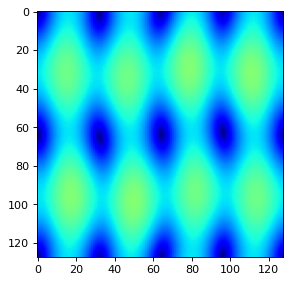

t= 0.0122  c0_max = 1.0199  cf_max = 1.3327  v_max= 1.4453  alpha= 0.9172  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0134  c0_max = 1.0221  cf_max = 1.3353  v_max= 1.4488  alpha= 0.9168  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0147  c0_max = 1.0242  cf_max = 1.3377  v_max= 1.4523  alpha= 0.9163  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0159  c0_max = 1.0263  cf_max = 1.3402  v_max= 1.4557  alpha= 0.9159  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0171  c0_max = 1.0284  cf_max = 1.3428  v_max= 1.4592  alpha= 0.9155  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0183  c0_max = 1.0305  cf_max = 1.3455  v_max= 1.4629  alpha= 0.9151  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0195  c0_max = 1.0326  cf_max = 1.3479  v_max= 1.4665  alpha= 0.9147  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0207  c0_max = 1.0346  cf_max = 1.3504  v_max= 1.4701  alpha= 0.9143  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


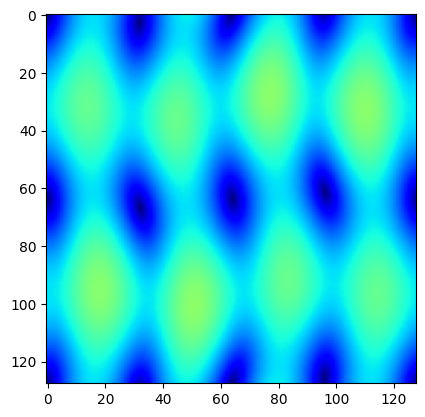

t= 0.0219  c0_max = 1.0366  cf_max = 1.3528  v_max= 1.4736  alpha= 0.9138  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0231  c0_max = 1.0387  cf_max = 1.3555  v_max= 1.4771  alpha= 0.9134  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0243  c0_max = 1.0407  cf_max = 1.3580  v_max= 1.4807  alpha= 0.9130  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0255  c0_max = 1.0427  cf_max = 1.3605  v_max= 1.4842  alpha= 0.9126  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0267  c0_max = 1.0446  cf_max = 1.3629  v_max= 1.4878  alpha= 0.9122  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0279  c0_max = 1.0467  cf_max = 1.3652  v_max= 1.4914  alpha= 0.9117  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0290  c0_max = 1.0486  cf_max = 1.3677  v_max= 1.4950  alpha= 0.9113  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0302  c0_max = 1.0506  cf_max = 1.3701  v_max= 1.4985  alpha= 0.9108  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


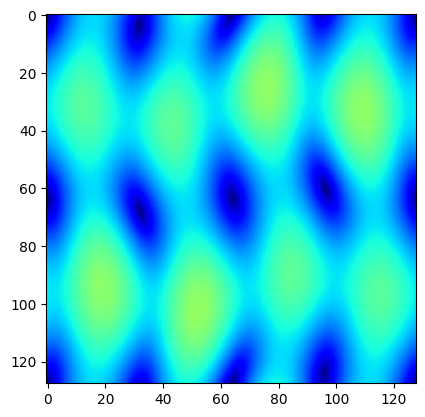

t= 0.0314  c0_max = 1.0524  cf_max = 1.3726  v_max= 1.5020  alpha= 0.9104  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0326  c0_max = 1.0544  cf_max = 1.3749  v_max= 1.5055  alpha= 0.9100  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0338  c0_max = 1.0564  cf_max = 1.3772  v_max= 1.5088  alpha= 0.9096  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0350  c0_max = 1.0582  cf_max = 1.3793  v_max= 1.5124  alpha= 0.9092  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0361  c0_max = 1.0601  cf_max = 1.3815  v_max= 1.5160  alpha= 0.9088  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0373  c0_max = 1.0619  cf_max = 1.3840  v_max= 1.5195  alpha= 0.9083  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0385  c0_max = 1.0639  cf_max = 1.3863  v_max= 1.5229  alpha= 0.9079  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0397  c0_max = 1.0658  cf_max = 1.3884  v_max= 1.5261  alpha= 0.9075  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0409  c0_max = 1.0677  cf_max = 1.3

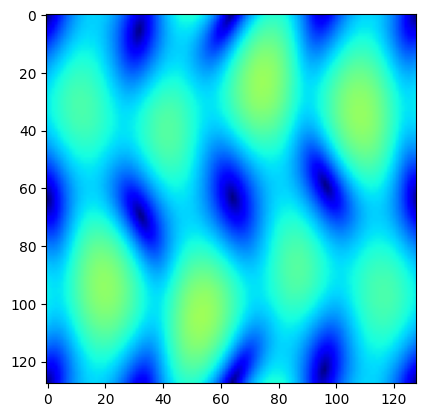

t= 0.0420  c0_max = 1.0695  cf_max = 1.3926  v_max= 1.5327  alpha= 0.9067  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0432  c0_max = 1.0713  cf_max = 1.3946  v_max= 1.5363  alpha= 0.9063  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0444  c0_max = 1.0734  cf_max = 1.3968  v_max= 1.5397  alpha= 0.9059  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0455  c0_max = 1.0777  cf_max = 1.3989  v_max= 1.5430  alpha= 0.9055  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0467  c0_max = 1.0821  cf_max = 1.4009  v_max= 1.5460  alpha= 0.9050  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0479  c0_max = 1.0866  cf_max = 1.4030  v_max= 1.5489  alpha= 0.9046  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0490  c0_max = 1.0913  cf_max = 1.4050  v_max= 1.5520  alpha= 0.9042  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0502  c0_max = 1.0961  cf_max = 1.4067  v_max= 1.5554  alpha= 0.9039  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


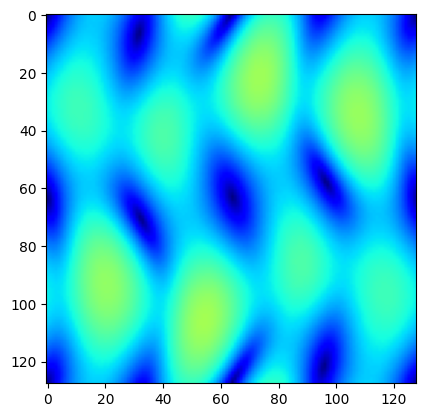

t= 0.0513  c0_max = 1.1010  cf_max = 1.4087  v_max= 1.5587  alpha= 0.9035  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0525  c0_max = 1.1061  cf_max = 1.4107  v_max= 1.5618  alpha= 0.9031  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0537  c0_max = 1.1113  cf_max = 1.4128  v_max= 1.5646  alpha= 0.9027  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0548  c0_max = 1.1166  cf_max = 1.4148  v_max= 1.5673  alpha= 0.9023  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0560  c0_max = 1.1220  cf_max = 1.4166  v_max= 1.5701  alpha= 0.9019  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0571  c0_max = 1.1276  cf_max = 1.4184  v_max= 1.5733  alpha= 0.9015  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0583  c0_max = 1.1332  cf_max = 1.4202  v_max= 1.5762  alpha= 0.9011  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0594  c0_max = 1.1390  cf_max = 1.4221  v_max= 1.5790  alpha= 0.9007  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0606  c0_max = 1.1448  cf_max = 1.4

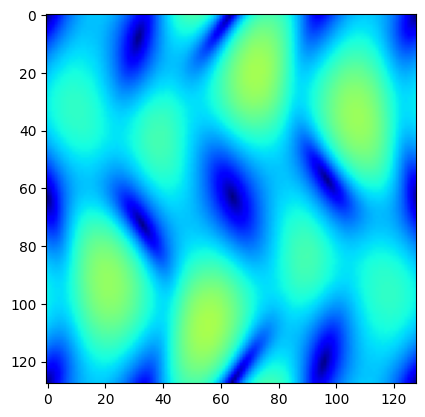

t= 0.0617  c0_max = 1.1508  cf_max = 1.4261  v_max= 1.5840  alpha= 0.9000  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0629  c0_max = 1.1568  cf_max = 1.4279  v_max= 1.5865  alpha= 0.8996  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0640  c0_max = 1.1629  cf_max = 1.4297  v_max= 1.5894  alpha= 0.8992  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0652  c0_max = 1.1690  cf_max = 1.4313  v_max= 1.5922  alpha= 0.8988  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0663  c0_max = 1.1752  cf_max = 1.4332  v_max= 1.5947  alpha= 0.8984  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0675  c0_max = 1.1815  cf_max = 1.4352  v_max= 1.5970  alpha= 0.8980  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0686  c0_max = 1.1878  cf_max = 1.4370  v_max= 1.5991  alpha= 0.8977  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0698  c0_max = 1.1941  cf_max = 1.4390  v_max= 1.6010  alpha= 0.8973  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0709  c0_max = 1.2004  cf_max = 1.4

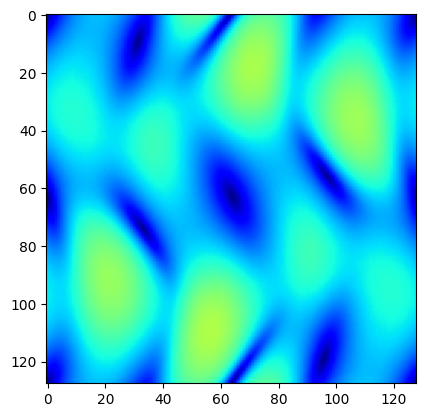

t= 0.0720  c0_max = 1.2067  cf_max = 1.4424  v_max= 1.6062  alpha= 0.8966  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0732  c0_max = 1.2130  cf_max = 1.4443  v_max= 1.6085  alpha= 0.8962  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0743  c0_max = 1.2193  cf_max = 1.4463  v_max= 1.6106  alpha= 0.8958  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0755  c0_max = 1.2255  cf_max = 1.4484  v_max= 1.6124  alpha= 0.8954  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0766  c0_max = 1.2317  cf_max = 1.4505  v_max= 1.6141  alpha= 0.8950  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0777  c0_max = 1.2379  cf_max = 1.4523  v_max= 1.6162  alpha= 0.8946  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0789  c0_max = 1.2439  cf_max = 1.4542  v_max= 1.6185  alpha= 0.8942  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0800  c0_max = 1.2500  cf_max = 1.4562  v_max= 1.6206  alpha= 0.8938  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


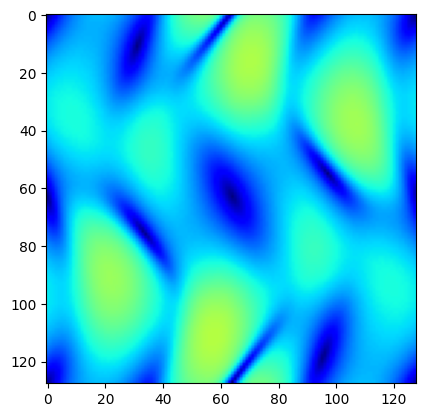

t= 0.0812  c0_max = 1.2559  cf_max = 1.4581  v_max= 1.6225  alpha= 0.8935  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0823  c0_max = 1.2617  cf_max = 1.4605  v_max= 1.6241  alpha= 0.8931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0834  c0_max = 1.2675  cf_max = 1.4627  v_max= 1.6256  alpha= 0.8927  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0846  c0_max = 1.2731  cf_max = 1.4650  v_max= 1.6270  alpha= 0.8923  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0857  c0_max = 1.2787  cf_max = 1.4674  v_max= 1.6290  alpha= 0.8919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0868  c0_max = 1.2841  cf_max = 1.4696  v_max= 1.6309  alpha= 0.8914  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0880  c0_max = 1.2895  cf_max = 1.4722  v_max= 1.6326  alpha= 0.8910  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0891  c0_max = 1.2947  cf_max = 1.4749  v_max= 1.6342  alpha= 0.8906  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0902  c0_max = 1.2997  cf_max = 1.4

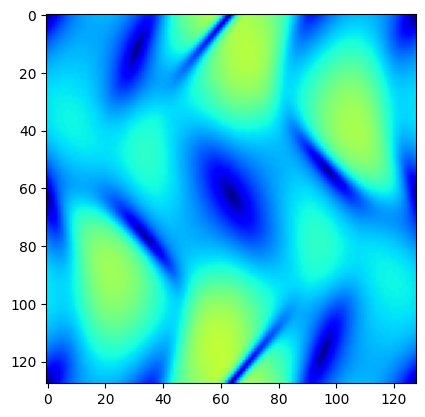

t= 0.0914  c0_max = 1.3047  cf_max = 1.4810  v_max= 1.6367  alpha= 0.8897  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0925  c0_max = 1.3095  cf_max = 1.4843  v_max= 1.6379  alpha= 0.8893  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0937  c0_max = 1.3142  cf_max = 1.4878  v_max= 1.6395  alpha= 0.8888  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0948  c0_max = 1.3187  cf_max = 1.4921  v_max= 1.6411  alpha= 0.8883  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0959  c0_max = 1.3232  cf_max = 1.4971  v_max= 1.6425  alpha= 0.8878  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0971  c0_max = 1.3274  cf_max = 1.5026  v_max= 1.6438  alpha= 0.8872  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0982  c0_max = 1.3316  cf_max = 1.5089  v_max= 1.6450  alpha= 0.8867  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.0993  c0_max = 1.3356  cf_max = 1.5160  v_max= 1.6461  alpha= 0.8862  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1005  c0_max = 1.3395  cf_max = 1.5

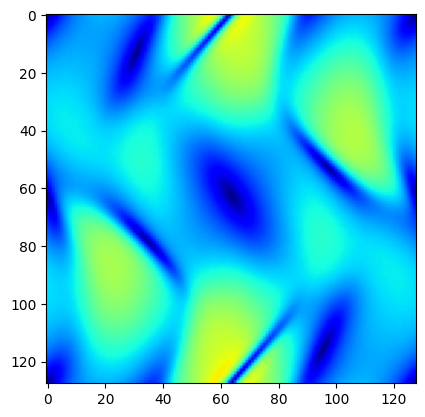

t= 0.1016  c0_max = 1.3433  cf_max = 1.5324  v_max= 1.6483  alpha= 0.8851  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1027  c0_max = 1.3469  cf_max = 1.5413  v_max= 1.6496  alpha= 0.8844  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1039  c0_max = 1.3504  cf_max = 1.5503  v_max= 1.6509  alpha= 0.8838  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1050  c0_max = 1.3537  cf_max = 1.5592  v_max= 1.6520  alpha= 0.8830  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1062  c0_max = 1.3569  cf_max = 1.5685  v_max= 1.6530  alpha= 0.8823  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1073  c0_max = 1.3600  cf_max = 1.5778  v_max= 1.6539  alpha= 0.8814  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1084  c0_max = 1.3630  cf_max = 1.5871  v_max= 1.6547  alpha= 0.8805  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1096  c0_max = 1.3658  cf_max = 1.5963  v_max= 1.6554  alpha= 0.8792  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1107  c0_max = 1.3685  cf_max = 1.6

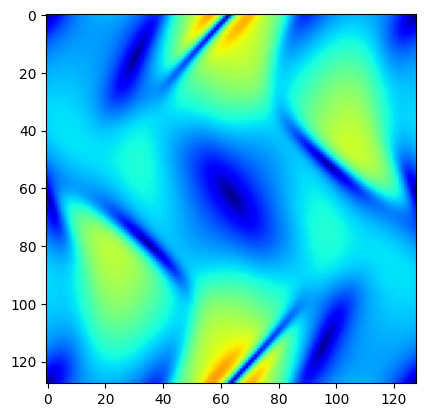

t= 0.1118  c0_max = 1.3711  cf_max = 1.6142  v_max= 1.6575  alpha= 0.8757  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1130  c0_max = 1.3735  cf_max = 1.6230  v_max= 1.6585  alpha= 0.8737  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1141  c0_max = 1.3757  cf_max = 1.6318  v_max= 1.6593  alpha= 0.8716  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1153  c0_max = 1.3778  cf_max = 1.6404  v_max= 1.6602  alpha= 0.8696  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1164  c0_max = 1.3799  cf_max = 1.6487  v_max= 1.6609  alpha= 0.8675  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1176  c0_max = 1.3818  cf_max = 1.6568  v_max= 1.6615  alpha= 0.8654  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1187  c0_max = 1.3836  cf_max = 1.6656  v_max= 1.6620  alpha= 0.8634  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1198  c0_max = 1.3854  cf_max = 1.6741  v_max= 1.6625  alpha= 0.8613  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1210  c0_max = 1.3870  cf_max = 1.6

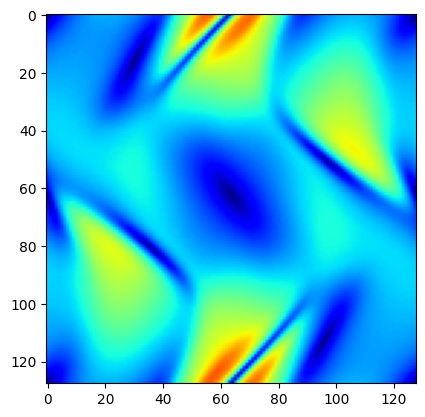

t= 0.1221  c0_max = 1.3886  cf_max = 1.6903  v_max= 1.6643  alpha= 0.8572  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1233  c0_max = 1.3900  cf_max = 1.6980  v_max= 1.6650  alpha= 0.8553  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1244  c0_max = 1.3913  cf_max = 1.7055  v_max= 1.6656  alpha= 0.8534  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1256  c0_max = 1.3926  cf_max = 1.7128  v_max= 1.6662  alpha= 0.8516  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1267  c0_max = 1.3938  cf_max = 1.7198  v_max= 1.6667  alpha= 0.8498  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1279  c0_max = 1.3948  cf_max = 1.7267  v_max= 1.6671  alpha= 0.8481  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1290  c0_max = 1.3958  cf_max = 1.7334  v_max= 1.6674  alpha= 0.8464  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1302  c0_max = 1.3968  cf_max = 1.7398  v_max= 1.6677  alpha= 0.8448  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


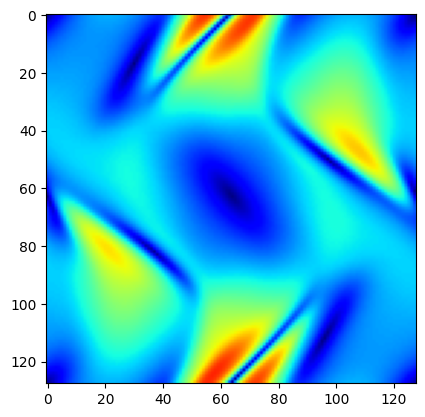

t= 0.1313  c0_max = 1.3977  cf_max = 1.7460  v_max= 1.6681  alpha= 0.8430  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1325  c0_max = 1.3985  cf_max = 1.7519  v_max= 1.6689  alpha= 0.8413  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1336  c0_max = 1.3993  cf_max = 1.7576  v_max= 1.6697  alpha= 0.8396  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1348  c0_max = 1.4001  cf_max = 1.7635  v_max= 1.6703  alpha= 0.8380  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1360  c0_max = 1.4008  cf_max = 1.7697  v_max= 1.6709  alpha= 0.8364  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1371  c0_max = 1.4015  cf_max = 1.7756  v_max= 1.6714  alpha= 0.8349  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1383  c0_max = 1.4022  cf_max = 1.7813  v_max= 1.6719  alpha= 0.8334  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1394  c0_max = 1.4028  cf_max = 1.7867  v_max= 1.6724  alpha= 0.8320  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1406  c0_max = 1.4035  cf_max = 1.7

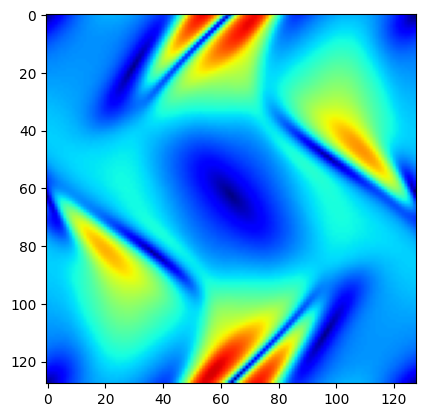

t= 0.1418  c0_max = 1.4042  cf_max = 1.7971  v_max= 1.6732  alpha= 0.8294  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1429  c0_max = 1.4048  cf_max = 1.8020  v_max= 1.6736  alpha= 0.8281  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1441  c0_max = 1.4054  cf_max = 1.8067  v_max= 1.6740  alpha= 0.8269  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1453  c0_max = 1.4061  cf_max = 1.8113  v_max= 1.6743  alpha= 0.8257  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1464  c0_max = 1.4067  cf_max = 1.8157  v_max= 1.6746  alpha= 0.8246  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1476  c0_max = 1.4072  cf_max = 1.8200  v_max= 1.6749  alpha= 0.8234  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1488  c0_max = 1.4078  cf_max = 1.8242  v_max= 1.6755  alpha= 0.8224  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1499  c0_max = 1.4083  cf_max = 1.8282  v_max= 1.6763  alpha= 0.8213  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1511  c0_max = 1.4088  cf_max = 1.8

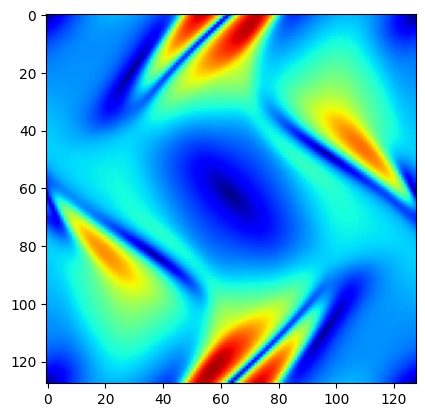

t= 0.1523  c0_max = 1.4093  cf_max = 1.8358  v_max= 1.6777  alpha= 0.8191  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1535  c0_max = 1.4098  cf_max = 1.8393  v_max= 1.6784  alpha= 0.8181  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1546  c0_max = 1.4103  cf_max = 1.8426  v_max= 1.6790  alpha= 0.8171  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1558  c0_max = 1.4108  cf_max = 1.8457  v_max= 1.6796  alpha= 0.8161  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1570  c0_max = 1.4112  cf_max = 1.8488  v_max= 1.6801  alpha= 0.8152  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1582  c0_max = 1.4116  cf_max = 1.8517  v_max= 1.6806  alpha= 0.8142  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1594  c0_max = 1.4121  cf_max = 1.8546  v_max= 1.6810  alpha= 0.8134  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1605  c0_max = 1.4125  cf_max = 1.8578  v_max= 1.6814  alpha= 0.8125  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


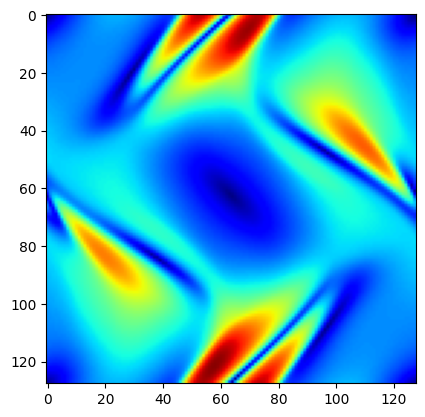

t= 0.1617  c0_max = 1.4130  cf_max = 1.8608  v_max= 1.6818  alpha= 0.8117  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1629  c0_max = 1.4134  cf_max = 1.8637  v_max= 1.6828  alpha= 0.8109  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1641  c0_max = 1.4138  cf_max = 1.8665  v_max= 1.6839  alpha= 0.8101  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1653  c0_max = 1.4143  cf_max = 1.8691  v_max= 1.6848  alpha= 0.8094  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1665  c0_max = 1.4147  cf_max = 1.8715  v_max= 1.6858  alpha= 0.8086  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1677  c0_max = 1.4152  cf_max = 1.8738  v_max= 1.6868  alpha= 0.8079  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1689  c0_max = 1.4156  cf_max = 1.8760  v_max= 1.6877  alpha= 0.8072  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1701  c0_max = 1.4161  cf_max = 1.8780  v_max= 1.6885  alpha= 0.8065  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


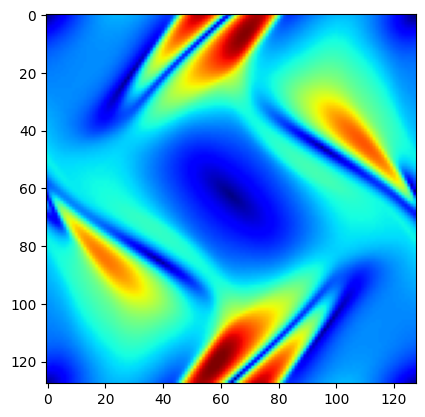

t= 0.1713  c0_max = 1.4165  cf_max = 1.8801  v_max= 1.6894  alpha= 0.8059  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1725  c0_max = 1.4170  cf_max = 1.8823  v_max= 1.6901  alpha= 0.8052  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1737  c0_max = 1.4175  cf_max = 1.8843  v_max= 1.6909  alpha= 0.8047  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1749  c0_max = 1.4180  cf_max = 1.8862  v_max= 1.6915  alpha= 0.8040  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1761  c0_max = 1.4185  cf_max = 1.8879  v_max= 1.6921  alpha= 0.8034  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1773  c0_max = 1.4190  cf_max = 1.8895  v_max= 1.6928  alpha= 0.8028  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1785  c0_max = 1.4200  cf_max = 1.8910  v_max= 1.6939  alpha= 0.8022  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1797  c0_max = 1.4220  cf_max = 1.8927  v_max= 1.6954  alpha= 0.8017  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1809  c0_max = 1.4235  cf_max = 1.8

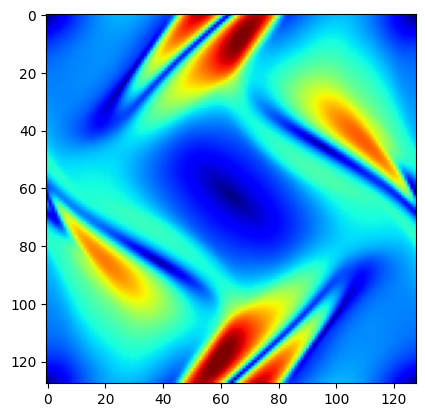

t= 0.1821  c0_max = 1.4247  cf_max = 1.8958  v_max= 1.6983  alpha= 0.8008  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1833  c0_max = 1.4254  cf_max = 1.8971  v_max= 1.6996  alpha= 0.8003  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1845  c0_max = 1.4258  cf_max = 1.8983  v_max= 1.7010  alpha= 0.7998  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1857  c0_max = 1.4260  cf_max = 1.8996  v_max= 1.7022  alpha= 0.7994  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1869  c0_max = 1.4261  cf_max = 1.9010  v_max= 1.7034  alpha= 0.7989  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1882  c0_max = 1.4267  cf_max = 1.9023  v_max= 1.7046  alpha= 0.7985  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1894  c0_max = 1.4271  cf_max = 1.9035  v_max= 1.7058  alpha= 0.7981  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1906  c0_max = 1.4273  cf_max = 1.9046  v_max= 1.7076  alpha= 0.7978  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


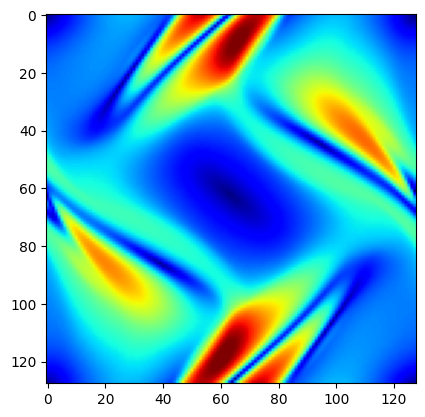

t= 0.1918  c0_max = 1.4273  cf_max = 1.9056  v_max= 1.7095  alpha= 0.7974  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1930  c0_max = 1.4271  cf_max = 1.9065  v_max= 1.7114  alpha= 0.7971  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1943  c0_max = 1.4272  cf_max = 1.9073  v_max= 1.7132  alpha= 0.7968  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1955  c0_max = 1.4278  cf_max = 1.9080  v_max= 1.7151  alpha= 0.7965  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1967  c0_max = 1.4284  cf_max = 1.9088  v_max= 1.7170  alpha= 0.7962  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1979  c0_max = 1.4290  cf_max = 1.9098  v_max= 1.7190  alpha= 0.7958  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.1992  c0_max = 1.4296  cf_max = 1.9106  v_max= 1.7210  alpha= 0.7955  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2004  c0_max = 1.4301  cf_max = 1.9113  v_max= 1.7232  alpha= 0.7953  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


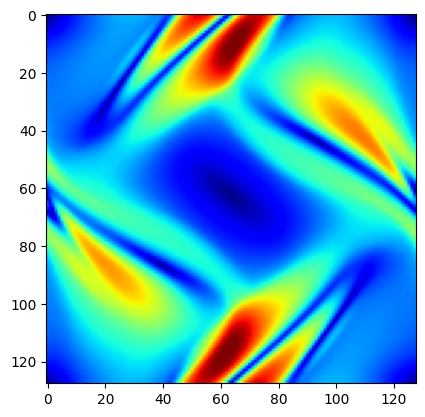

t= 0.2016  c0_max = 1.4306  cf_max = 1.9119  v_max= 1.7255  alpha= 0.7950  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2028  c0_max = 1.4311  cf_max = 1.9125  v_max= 1.7279  alpha= 0.7947  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2040  c0_max = 1.4316  cf_max = 1.9131  v_max= 1.7305  alpha= 0.7945  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2052  c0_max = 1.4320  cf_max = 1.9136  v_max= 1.7333  alpha= 0.7942  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2064  c0_max = 1.4324  cf_max = 1.9141  v_max= 1.7362  alpha= 0.7939  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2076  c0_max = 1.4327  cf_max = 1.9144  v_max= 1.7392  alpha= 0.7937  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2088  c0_max = 1.4330  cf_max = 1.9150  v_max= 1.7424  alpha= 0.7934  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2100  c0_max = 1.4332  cf_max = 1.9155  v_max= 1.7457  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


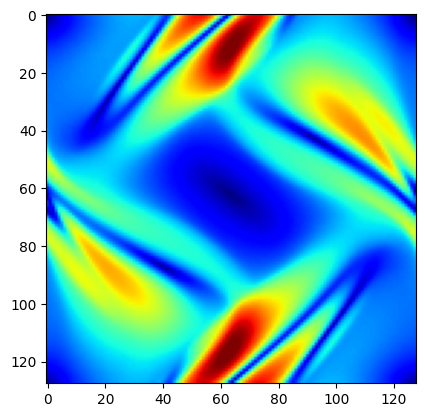

t= 0.2112  c0_max = 1.4334  cf_max = 1.9158  v_max= 1.7493  alpha= 0.7929  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2124  c0_max = 1.4336  cf_max = 1.9160  v_max= 1.7530  alpha= 0.7926  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2136  c0_max = 1.4337  cf_max = 1.9162  v_max= 1.7568  alpha= 0.7924  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2148  c0_max = 1.4337  cf_max = 1.9163  v_max= 1.7608  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2160  c0_max = 1.4337  cf_max = 1.9162  v_max= 1.7649  alpha= 0.7920  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2172  c0_max = 1.4337  cf_max = 1.9162  v_max= 1.7690  alpha= 0.7919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2184  c0_max = 1.4335  cf_max = 1.9160  v_max= 1.7731  alpha= 0.7917  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2196  c0_max = 1.4333  cf_max = 1.9160  v_max= 1.7773  alpha= 0.7916  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2208  c0_max = 1.4331  cf_max = 1.9

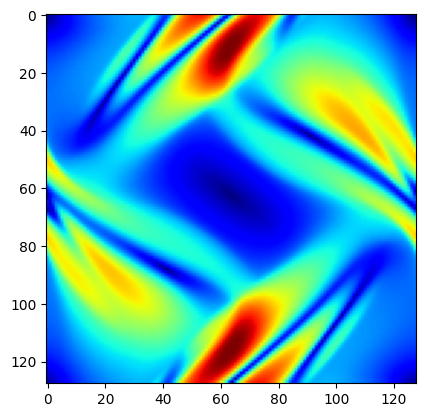

t= 0.2219  c0_max = 1.4327  cf_max = 1.9160  v_max= 1.7857  alpha= 0.7912  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2231  c0_max = 1.4324  cf_max = 1.9158  v_max= 1.7897  alpha= 0.7910  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2243  c0_max = 1.4319  cf_max = 1.9156  v_max= 1.7934  alpha= 0.7909  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2255  c0_max = 1.4314  cf_max = 1.9153  v_max= 1.7974  alpha= 0.7907  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2267  c0_max = 1.4308  cf_max = 1.9150  v_max= 1.8018  alpha= 0.7906  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2278  c0_max = 1.4301  cf_max = 1.9146  v_max= 1.8062  alpha= 0.7905  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2290  c0_max = 1.4294  cf_max = 1.9141  v_max= 1.8104  alpha= 0.7904  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2302  c0_max = 1.4286  cf_max = 1.9135  v_max= 1.8144  alpha= 0.7903  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


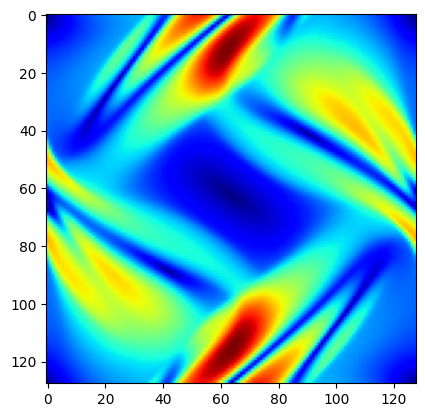

t= 0.2314  c0_max = 1.4277  cf_max = 1.9129  v_max= 1.8180  alpha= 0.7903  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2325  c0_max = 1.4268  cf_max = 1.9122  v_max= 1.8224  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2337  c0_max = 1.4258  cf_max = 1.9118  v_max= 1.8269  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2349  c0_max = 1.4247  cf_max = 1.9114  v_max= 1.8311  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2360  c0_max = 1.4236  cf_max = 1.9109  v_max= 1.8349  alpha= 0.7901  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2372  c0_max = 1.4224  cf_max = 1.9103  v_max= 1.8385  alpha= 0.7901  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2384  c0_max = 1.4212  cf_max = 1.9097  v_max= 1.8416  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2395  c0_max = 1.4199  cf_max = 1.9089  v_max= 1.8449  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2407  c0_max = 1.4186  cf_max = 1.9

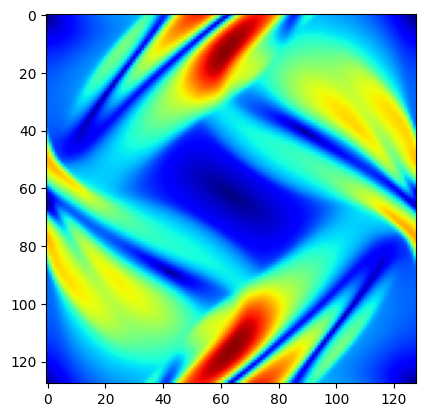

t= 0.2419  c0_max = 1.4172  cf_max = 1.9072  v_max= 1.8527  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2430  c0_max = 1.4159  cf_max = 1.9063  v_max= 1.8559  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2442  c0_max = 1.4145  cf_max = 1.9053  v_max= 1.8587  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2453  c0_max = 1.4130  cf_max = 1.9042  v_max= 1.8630  alpha= 0.7901  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2465  c0_max = 1.4115  cf_max = 1.9030  v_max= 1.8670  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2477  c0_max = 1.4101  cf_max = 1.9018  v_max= 1.8705  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2488  c0_max = 1.4086  cf_max = 1.9005  v_max= 1.8737  alpha= 0.7903  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2500  c0_max = 1.4070  cf_max = 1.8992  v_max= 1.8765  alpha= 0.7904  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2511  c0_max = 1.4055  cf_max = 1.8

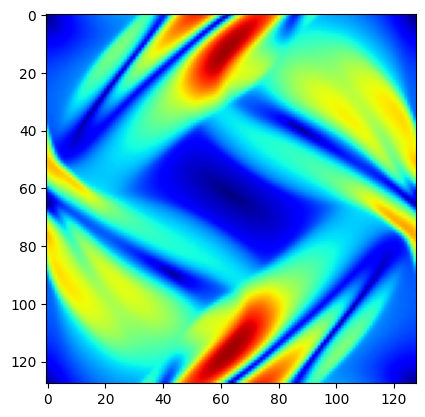

t= 0.2523  c0_max = 1.4040  cf_max = 1.8964  v_max= 1.8812  alpha= 0.7907  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2534  c0_max = 1.4025  cf_max = 1.8950  v_max= 1.8829  alpha= 0.7908  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2546  c0_max = 1.4009  cf_max = 1.8935  v_max= 1.8841  alpha= 0.7909  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2557  c0_max = 1.3994  cf_max = 1.8920  v_max= 1.8847  alpha= 0.7911  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2569  c0_max = 1.3979  cf_max = 1.8904  v_max= 1.8849  alpha= 0.7912  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2581  c0_max = 1.3963  cf_max = 1.8889  v_max= 1.8846  alpha= 0.7914  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2592  c0_max = 1.3948  cf_max = 1.8875  v_max= 1.8836  alpha= 0.7915  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2604  c0_max = 1.3933  cf_max = 1.8864  v_max= 1.8819  alpha= 0.7917  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


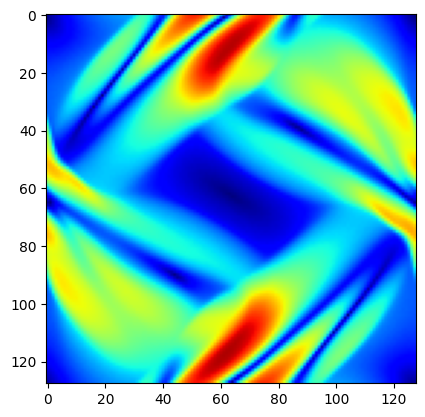

t= 0.2615  c0_max = 1.3918  cf_max = 1.8853  v_max= 1.8794  alpha= 0.7917  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2627  c0_max = 1.3904  cf_max = 1.8844  v_max= 1.8768  alpha= 0.7917  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2638  c0_max = 1.3889  cf_max = 1.8834  v_max= 1.8744  alpha= 0.7918  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2650  c0_max = 1.3965  cf_max = 1.8824  v_max= 1.8714  alpha= 0.7918  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2661  c0_max = 1.4065  cf_max = 1.8813  v_max= 1.8680  alpha= 0.7918  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2673  c0_max = 1.4150  cf_max = 1.8803  v_max= 1.8642  alpha= 0.7919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2684  c0_max = 1.4219  cf_max = 1.8792  v_max= 1.8598  alpha= 0.7919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2696  c0_max = 1.4274  cf_max = 1.8782  v_max= 1.8548  alpha= 0.7919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2707  c0_max = 1.4318  cf_max = 1.8

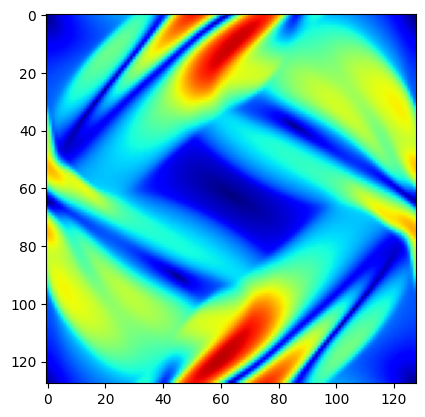

t= 0.2719  c0_max = 1.4354  cf_max = 1.8760  v_max= 1.8443  alpha= 0.7920  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2730  c0_max = 1.4410  cf_max = 1.8750  v_max= 1.8393  alpha= 0.7921  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2742  c0_max = 1.4469  cf_max = 1.8739  v_max= 1.8339  alpha= 0.7921  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2753  c0_max = 1.4520  cf_max = 1.8728  v_max= 1.8278  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2765  c0_max = 1.4563  cf_max = 1.8718  v_max= 1.8211  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2777  c0_max = 1.4633  cf_max = 1.8707  v_max= 1.8141  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2788  c0_max = 1.4708  cf_max = 1.8697  v_max= 1.8082  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2800  c0_max = 1.4767  cf_max = 1.8687  v_max= 1.8016  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2812  c0_max = 1.4810  cf_max = 1.8

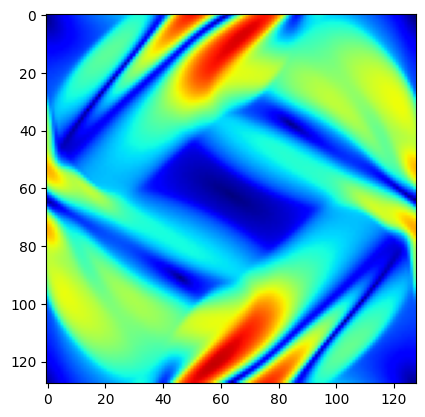

t= 0.2823  c0_max = 1.4839  cf_max = 1.8670  v_max= 1.7860  alpha= 0.7923  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2835  c0_max = 1.4860  cf_max = 1.8663  v_max= 1.7787  alpha= 0.7923  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2847  c0_max = 1.4878  cf_max = 1.8655  v_max= 1.7715  alpha= 0.7923  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2858  c0_max = 1.4895  cf_max = 1.8648  v_max= 1.7633  alpha= 0.7924  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2870  c0_max = 1.4907  cf_max = 1.8640  v_max= 1.7542  alpha= 0.7924  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2882  c0_max = 1.4920  cf_max = 1.8632  v_max= 1.7463  alpha= 0.7924  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2894  c0_max = 1.4965  cf_max = 1.8624  v_max= 1.7401  alpha= 0.7925  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2905  c0_max = 1.4995  cf_max = 1.8616  v_max= 1.7341  alpha= 0.7925  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


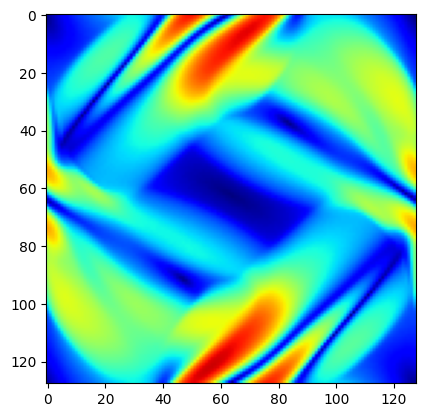

t= 0.2917  c0_max = 1.5011  cf_max = 1.8608  v_max= 1.7291  alpha= 0.7926  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2929  c0_max = 1.5017  cf_max = 1.8599  v_max= 1.7236  alpha= 0.7926  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2941  c0_max = 1.5017  cf_max = 1.8591  v_max= 1.7177  alpha= 0.7927  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2953  c0_max = 1.5014  cf_max = 1.8582  v_max= 1.7112  alpha= 0.7927  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2965  c0_max = 1.5013  cf_max = 1.8574  v_max= 1.7041  alpha= 0.7928  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2976  c0_max = 1.5009  cf_max = 1.8565  v_max= 1.6966  alpha= 0.7928  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.2988  c0_max = 1.4995  cf_max = 1.8556  v_max= 1.6906  alpha= 0.7929  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3000  c0_max = 1.4995  cf_max = 1.8548  v_max= 1.6839  alpha= 0.7929  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


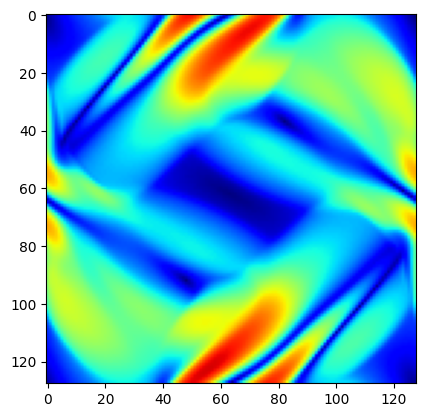

t= 0.3012  c0_max = 1.4994  cf_max = 1.8539  v_max= 1.6764  alpha= 0.7929  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3024  c0_max = 1.4982  cf_max = 1.8530  v_max= 1.6681  alpha= 0.7930  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3036  c0_max = 1.4961  cf_max = 1.8521  v_max= 1.6591  alpha= 0.7930  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3048  c0_max = 1.4941  cf_max = 1.8513  v_max= 1.6493  alpha= 0.7930  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3060  c0_max = 1.4919  cf_max = 1.8504  v_max= 1.6394  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3072  c0_max = 1.4891  cf_max = 1.8495  v_max= 1.6308  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3084  c0_max = 1.4858  cf_max = 1.8486  v_max= 1.6231  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3096  c0_max = 1.4824  cf_max = 1.8478  v_max= 1.6179  alpha= 0.7932  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3108  c0_max = 1.4814  cf_max = 1.8

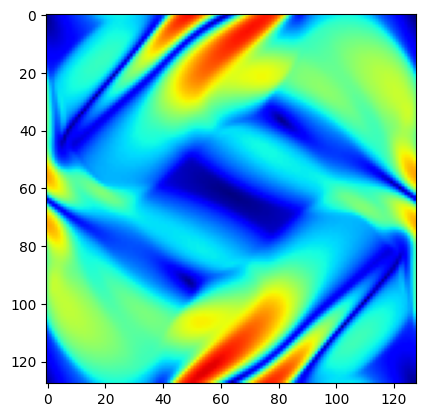

t= 0.3120  c0_max = 1.4795  cf_max = 1.8461  v_max= 1.6062  alpha= 0.7932  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3131  c0_max = 1.4767  cf_max = 1.8453  v_max= 1.5997  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3143  c0_max = 1.4730  cf_max = 1.8445  v_max= 1.5926  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3155  c0_max = 1.4690  cf_max = 1.8438  v_max= 1.5848  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3167  c0_max = 1.4646  cf_max = 1.8430  v_max= 1.5763  alpha= 0.7934  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3179  c0_max = 1.4613  cf_max = 1.8423  v_max= 1.5675  alpha= 0.7934  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3191  c0_max = 1.4592  cf_max = 1.8415  v_max= 1.5706  alpha= 0.7934  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3203  c0_max = 1.4562  cf_max = 1.8408  v_max= 1.5735  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


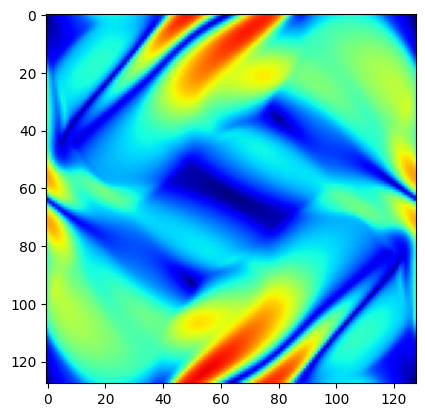

t= 0.3215  c0_max = 1.4525  cf_max = 1.8401  v_max= 1.5764  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3226  c0_max = 1.4484  cf_max = 1.8395  v_max= 1.5792  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3238  c0_max = 1.4443  cf_max = 1.8388  v_max= 1.5819  alpha= 0.7933  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3250  c0_max = 1.4403  cf_max = 1.8382  v_max= 1.5849  alpha= 0.7932  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3262  c0_max = 1.4369  cf_max = 1.8376  v_max= 1.5879  alpha= 0.7932  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3274  c0_max = 1.4339  cf_max = 1.8372  v_max= 1.5907  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3286  c0_max = 1.4304  cf_max = 1.8368  v_max= 1.5938  alpha= 0.7931  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3298  c0_max = 1.4266  cf_max = 1.8365  v_max= 1.5968  alpha= 0.7930  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3310  c0_max = 1.4227  cf_max = 1.8

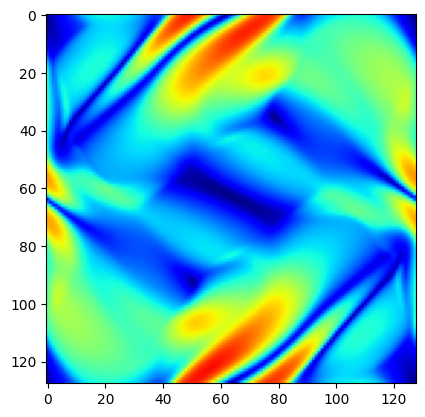

t= 0.3321  c0_max = 1.4187  cf_max = 1.8360  v_max= 1.6025  alpha= 0.7929  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3333  c0_max = 1.4152  cf_max = 1.8358  v_max= 1.6052  alpha= 0.7928  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3345  c0_max = 1.4126  cf_max = 1.8356  v_max= 1.6079  alpha= 0.7927  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3357  c0_max = 1.4097  cf_max = 1.8355  v_max= 1.6105  alpha= 0.7926  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3369  c0_max = 1.4064  cf_max = 1.8354  v_max= 1.6134  alpha= 0.7925  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3381  c0_max = 1.4027  cf_max = 1.8354  v_max= 1.6162  alpha= 0.7924  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3393  c0_max = 1.3984  cf_max = 1.8353  v_max= 1.6190  alpha= 0.7923  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3404  c0_max = 1.3948  cf_max = 1.8353  v_max= 1.6216  alpha= 0.7922  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


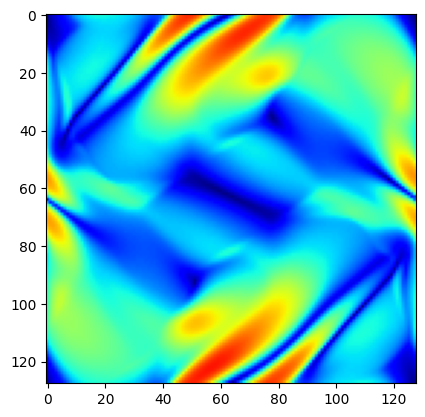

t= 0.3416  c0_max = 1.3913  cf_max = 1.8354  v_max= 1.6242  alpha= 0.7921  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3428  c0_max = 1.3890  cf_max = 1.8355  v_max= 1.6267  alpha= 0.7920  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3440  c0_max = 1.3873  cf_max = 1.8356  v_max= 1.6291  alpha= 0.7919  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3452  c0_max = 1.3854  cf_max = 1.8358  v_max= 1.6315  alpha= 0.7918  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3464  c0_max = 1.3828  cf_max = 1.8360  v_max= 1.6338  alpha= 0.7916  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3476  c0_max = 1.3798  cf_max = 1.8362  v_max= 1.6362  alpha= 0.7915  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3487  c0_max = 1.3786  cf_max = 1.8364  v_max= 1.6387  alpha= 0.7913  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3499  c0_max = 1.3775  cf_max = 1.8367  v_max= 1.6412  alpha= 0.7912  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3511  c0_max = 1.3763  cf_max = 1.8

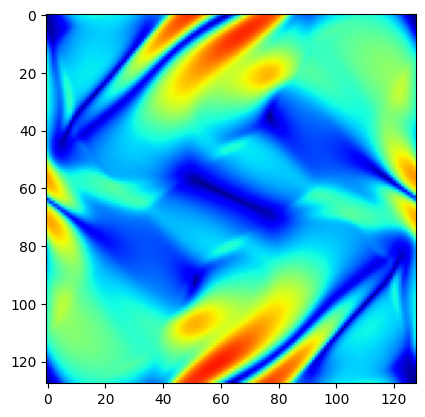

t= 0.3523  c0_max = 1.3752  cf_max = 1.8374  v_max= 1.6458  alpha= 0.7909  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3535  c0_max = 1.3740  cf_max = 1.8378  v_max= 1.6481  alpha= 0.7907  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3547  c0_max = 1.3729  cf_max = 1.8382  v_max= 1.6503  alpha= 0.7906  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3559  c0_max = 1.3721  cf_max = 1.8387  v_max= 1.6524  alpha= 0.7904  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3570  c0_max = 1.3714  cf_max = 1.8392  v_max= 1.6544  alpha= 0.7902  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3582  c0_max = 1.3708  cf_max = 1.8397  v_max= 1.6565  alpha= 0.7900  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3594  c0_max = 1.3702  cf_max = 1.8403  v_max= 1.6586  alpha= 0.7899  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3606  c0_max = 1.3701  cf_max = 1.8408  v_max= 1.6608  alpha= 0.7897  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


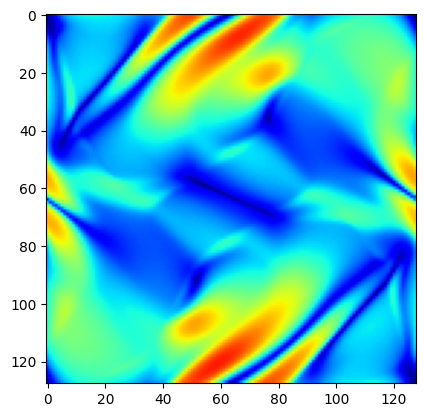

t= 0.3618  c0_max = 1.3704  cf_max = 1.8414  v_max= 1.6629  alpha= 0.7895  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3630  c0_max = 1.3706  cf_max = 1.8421  v_max= 1.6650  alpha= 0.7893  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3642  c0_max = 1.3708  cf_max = 1.8430  v_max= 1.6669  alpha= 0.7891  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3654  c0_max = 1.3711  cf_max = 1.8440  v_max= 1.6689  alpha= 0.7889  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3666  c0_max = 1.3713  cf_max = 1.8450  v_max= 1.6707  alpha= 0.7887  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3677  c0_max = 1.3715  cf_max = 1.8460  v_max= 1.6725  alpha= 0.7885  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3689  c0_max = 1.3718  cf_max = 1.8470  v_max= 1.6745  alpha= 0.7883  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3701  c0_max = 1.3720  cf_max = 1.8480  v_max= 1.6766  alpha= 0.7880  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


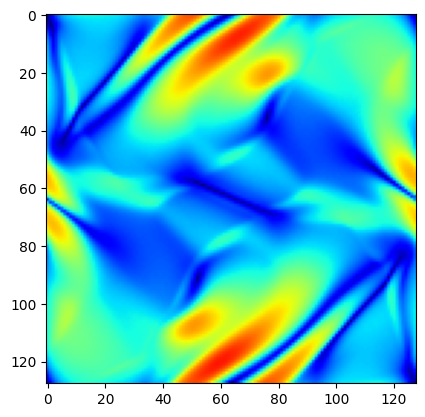

t= 0.3713  c0_max = 1.3722  cf_max = 1.8490  v_max= 1.6787  alpha= 0.7878  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3725  c0_max = 1.3724  cf_max = 1.8501  v_max= 1.6807  alpha= 0.7875  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3737  c0_max = 1.3727  cf_max = 1.8511  v_max= 1.6826  alpha= 0.7873  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3749  c0_max = 1.3729  cf_max = 1.8522  v_max= 1.6845  alpha= 0.7871  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3761  c0_max = 1.3731  cf_max = 1.8532  v_max= 1.6862  alpha= 0.7868  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3773  c0_max = 1.3733  cf_max = 1.8543  v_max= 1.6880  alpha= 0.7866  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3785  c0_max = 1.3735  cf_max = 1.8553  v_max= 1.6897  alpha= 0.7864  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3797  c0_max = 1.3738  cf_max = 1.8564  v_max= 1.6917  alpha= 0.7862  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3808  c0_max = 1.3749  cf_max = 1.8

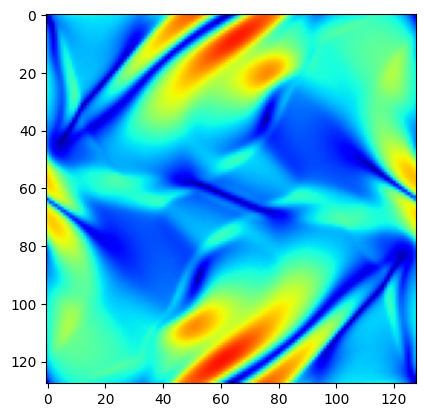

t= 0.3820  c0_max = 1.3840  cf_max = 1.8584  v_max= 1.6954  alpha= 0.7857  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3832  c0_max = 1.3904  cf_max = 1.8595  v_max= 1.6971  alpha= 0.7855  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3844  c0_max = 1.3947  cf_max = 1.8605  v_max= 1.6988  alpha= 0.7853  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3856  c0_max = 1.4008  cf_max = 1.8615  v_max= 1.7004  alpha= 0.7851  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3868  c0_max = 1.4057  cf_max = 1.8625  v_max= 1.7020  alpha= 0.7849  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3880  c0_max = 1.4078  cf_max = 1.8635  v_max= 1.7036  alpha= 0.7847  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3892  c0_max = 1.4080  cf_max = 1.8645  v_max= 1.7051  alpha= 0.7844  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3903  c0_max = 1.4070  cf_max = 1.8655  v_max= 1.7066  alpha= 0.7842  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


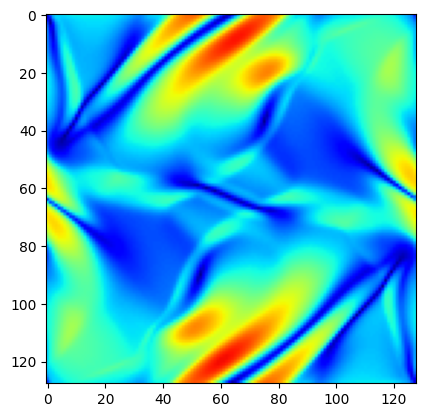

t= 0.3915  c0_max = 1.4049  cf_max = 1.8664  v_max= 1.7082  alpha= 0.7840  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3927  c0_max = 1.4037  cf_max = 1.8674  v_max= 1.7099  alpha= 0.7838  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3939  c0_max = 1.4037  cf_max = 1.8684  v_max= 1.7115  alpha= 0.7837  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3951  c0_max = 1.4031  cf_max = 1.8693  v_max= 1.7131  alpha= 0.7835  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3963  c0_max = 1.4005  cf_max = 1.8702  v_max= 1.7148  alpha= 0.7833  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3974  c0_max = 1.3981  cf_max = 1.8712  v_max= 1.7164  alpha= 0.7831  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3986  c0_max = 1.3950  cf_max = 1.8721  v_max= 1.7180  alpha= 0.7829  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.3998  c0_max = 1.3910  cf_max = 1.8731  v_max= 1.7197  alpha= 0.7827  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4010  c0_max = 1.3864  cf_max = 1.8

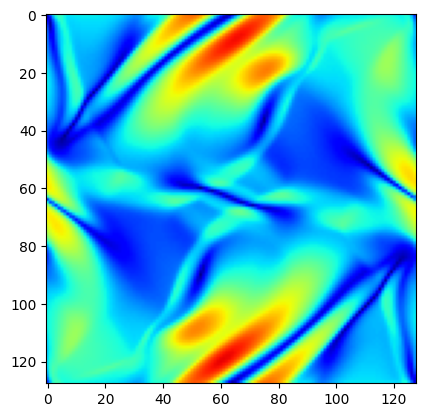

t= 0.4022  c0_max = 1.3836  cf_max = 1.8752  v_max= 1.7233  alpha= 0.7824  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4033  c0_max = 1.4044  cf_max = 1.8762  v_max= 1.7258  alpha= 0.7822  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4045  c0_max = 1.4232  cf_max = 1.8772  v_max= 1.7283  alpha= 0.7820  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4057  c0_max = 1.4386  cf_max = 1.8783  v_max= 1.7310  alpha= 0.7818  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4069  c0_max = 1.4506  cf_max = 1.8793  v_max= 1.7336  alpha= 0.7817  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4081  c0_max = 1.4595  cf_max = 1.8803  v_max= 1.7362  alpha= 0.7815  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4092  c0_max = 1.4656  cf_max = 1.8814  v_max= 1.7391  alpha= 0.7813  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4104  c0_max = 1.4693  cf_max = 1.8824  v_max= 1.7419  alpha= 0.7812  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


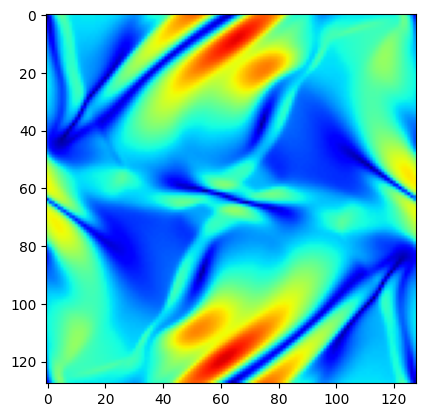

t= 0.4116  c0_max = 1.4708  cf_max = 1.8835  v_max= 1.7448  alpha= 0.7810  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4128  c0_max = 1.4707  cf_max = 1.8846  v_max= 1.7476  alpha= 0.7808  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4139  c0_max = 1.4692  cf_max = 1.8857  v_max= 1.7506  alpha= 0.7807  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4151  c0_max = 1.4669  cf_max = 1.8868  v_max= 1.7537  alpha= 0.7805  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4163  c0_max = 1.4638  cf_max = 1.8879  v_max= 1.7569  alpha= 0.7803  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4175  c0_max = 1.4601  cf_max = 1.8890  v_max= 1.7600  alpha= 0.7802  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4186  c0_max = 1.4559  cf_max = 1.8901  v_max= 1.7631  alpha= 0.7800  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4198  c0_max = 1.4512  cf_max = 1.8912  v_max= 1.7661  alpha= 0.7798  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4210  c0_max = 1.4460  cf_max = 1.8

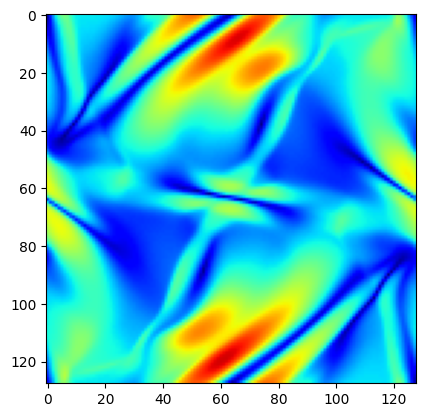

t= 0.4221  c0_max = 1.4407  cf_max = 1.8934  v_max= 1.7719  alpha= 0.7795  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4233  c0_max = 1.4353  cf_max = 1.8945  v_max= 1.7751  alpha= 0.7793  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4245  c0_max = 1.4326  cf_max = 1.8957  v_max= 1.7780  alpha= 0.7791  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4257  c0_max = 1.4284  cf_max = 1.8968  v_max= 1.7809  alpha= 0.7789  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4268  c0_max = 1.4244  cf_max = 1.8980  v_max= 1.7838  alpha= 0.7787  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4280  c0_max = 1.4230  cf_max = 1.8991  v_max= 1.7870  alpha= 0.7785  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4292  c0_max = 1.4198  cf_max = 1.9003  v_max= 1.7899  alpha= 0.7783  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4303  c0_max = 1.4378  cf_max = 1.9015  v_max= 1.7925  alpha= 0.7781  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


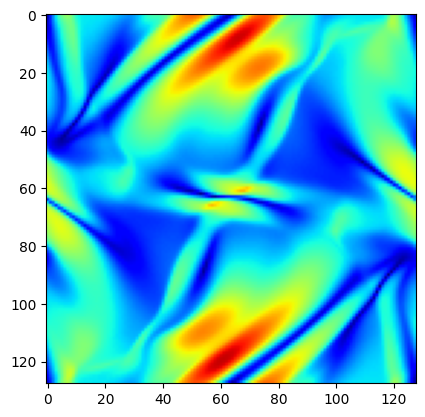

t= 0.4315  c0_max = 1.4530  cf_max = 1.9027  v_max= 1.7948  alpha= 0.7779  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4327  c0_max = 1.4654  cf_max = 1.9039  v_max= 1.7968  alpha= 0.7777  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4338  c0_max = 1.4760  cf_max = 1.9051  v_max= 1.7994  alpha= 0.7775  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4350  c0_max = 1.4866  cf_max = 1.9064  v_max= 1.8017  alpha= 0.7773  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4362  c0_max = 1.4957  cf_max = 1.9076  v_max= 1.8036  alpha= 0.7771  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4373  c0_max = 1.5031  cf_max = 1.9089  v_max= 1.8052  alpha= 0.7769  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4385  c0_max = 1.5115  cf_max = 1.9102  v_max= 1.8063  alpha= 0.7766  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4397  c0_max = 1.5192  cf_max = 1.9115  v_max= 1.8072  alpha= 0.7764  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4408  c0_max = 1.5260  cf_max = 1.9

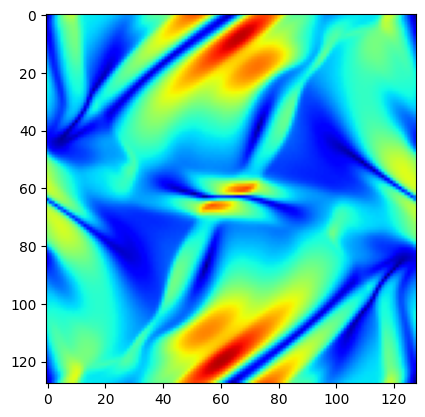

t= 0.4420  c0_max = 1.5317  cf_max = 1.9141  v_max= 1.8079  alpha= 0.7760  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4432  c0_max = 1.5368  cf_max = 1.9154  v_max= 1.8077  alpha= 0.7758  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4443  c0_max = 1.5413  cf_max = 1.9167  v_max= 1.8073  alpha= 0.7756  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4455  c0_max = 1.5457  cf_max = 1.9180  v_max= 1.8065  alpha= 0.7754  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4467  c0_max = 1.5501  cf_max = 1.9193  v_max= 1.8054  alpha= 0.7752  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4478  c0_max = 1.5547  cf_max = 1.9205  v_max= 1.8040  alpha= 0.7750  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4490  c0_max = 1.5591  cf_max = 1.9218  v_max= 1.8021  alpha= 0.7748  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4502  c0_max = 1.5638  cf_max = 1.9230  v_max= 1.7999  alpha= 0.7746  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


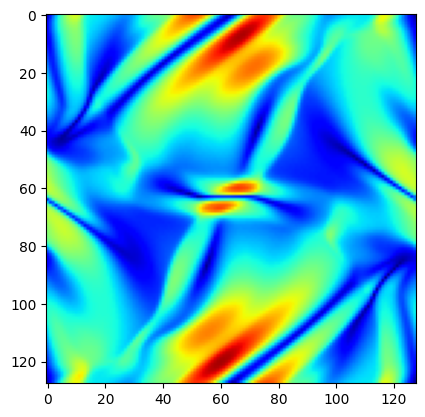

t= 0.4513  c0_max = 1.5684  cf_max = 1.9243  v_max= 1.7973  alpha= 0.7744  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4525  c0_max = 1.5731  cf_max = 1.9257  v_max= 1.7954  alpha= 0.7742  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4537  c0_max = 1.5781  cf_max = 1.9270  v_max= 1.7932  alpha= 0.7741  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4549  c0_max = 1.5833  cf_max = 1.9282  v_max= 1.7907  alpha= 0.7739  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4560  c0_max = 1.5883  cf_max = 1.9294  v_max= 1.7881  alpha= 0.7737  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4572  c0_max = 1.5931  cf_max = 1.9305  v_max= 1.7852  alpha= 0.7736  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4584  c0_max = 1.5976  cf_max = 1.9315  v_max= 1.7821  alpha= 0.7734  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4596  c0_max = 1.6017  cf_max = 1.9325  v_max= 1.7797  alpha= 0.7733  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4607  c0_max = 1.6056  cf_max = 1.9

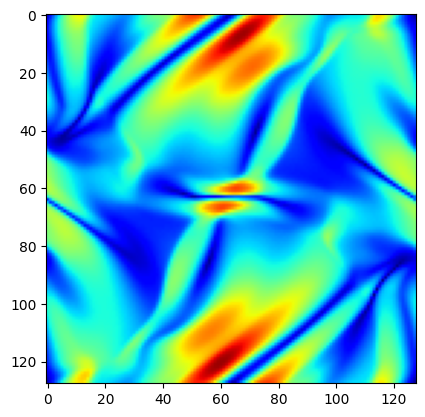

t= 0.4619  c0_max = 1.6098  cf_max = 1.9343  v_max= 1.7744  alpha= 0.7729  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4631  c0_max = 1.6138  cf_max = 1.9350  v_max= 1.7727  alpha= 0.7728  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4643  c0_max = 1.6176  cf_max = 1.9357  v_max= 1.7708  alpha= 0.7726  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4655  c0_max = 1.6211  cf_max = 1.9363  v_max= 1.7694  alpha= 0.7725  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4666  c0_max = 1.6243  cf_max = 1.9369  v_max= 1.7678  alpha= 0.7724  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4678  c0_max = 1.6274  cf_max = 1.9373  v_max= 1.7667  alpha= 0.7723  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4690  c0_max = 1.6301  cf_max = 1.9377  v_max= 1.7655  alpha= 0.7722  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4702  c0_max = 1.6326  cf_max = 1.9387  v_max= 1.7647  alpha= 0.7721  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


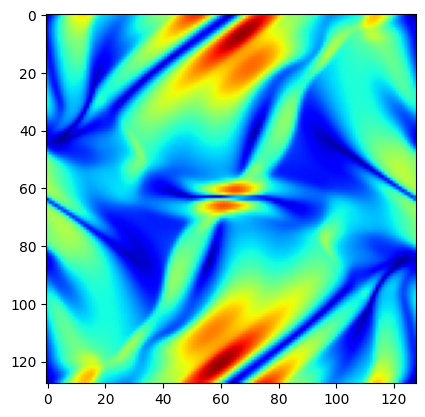

t= 0.4714  c0_max = 1.6348  cf_max = 1.9397  v_max= 1.7640  alpha= 0.7720  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4726  c0_max = 1.6372  cf_max = 1.9407  v_max= 1.7635  alpha= 0.7719  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4738  c0_max = 1.6394  cf_max = 1.9416  v_max= 1.7629  alpha= 0.7718  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4749  c0_max = 1.6413  cf_max = 1.9424  v_max= 1.7626  alpha= 0.7717  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4761  c0_max = 1.6431  cf_max = 1.9432  v_max= 1.7623  alpha= 0.7715  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4773  c0_max = 1.6445  cf_max = 1.9438  v_max= 1.7619  alpha= 0.7714  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4785  c0_max = 1.6458  cf_max = 1.9444  v_max= 1.7614  alpha= 0.7713  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4797  c0_max = 1.6469  cf_max = 1.9450  v_max= 1.7612  alpha= 0.7712  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4809  c0_max = 1.6478  cf_max = 1.9

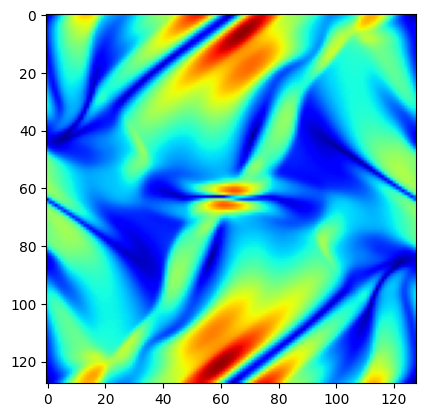

t= 0.4821  c0_max = 1.6485  cf_max = 1.9458  v_max= 1.7607  alpha= 0.7709  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4833  c0_max = 1.6491  cf_max = 1.9462  v_max= 1.7603  alpha= 0.7708  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4845  c0_max = 1.6495  cf_max = 1.9465  v_max= 1.7597  alpha= 0.7707  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4857  c0_max = 1.6497  cf_max = 1.9467  v_max= 1.7595  alpha= 0.7706  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4869  c0_max = 1.6497  cf_max = 1.9470  v_max= 1.7594  alpha= 0.7705  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4881  c0_max = 1.6496  cf_max = 1.9472  v_max= 1.7591  alpha= 0.7704  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4893  c0_max = 1.6493  cf_max = 1.9474  v_max= 1.7588  alpha= 0.7703  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4905  c0_max = 1.6489  cf_max = 1.9477  v_max= 1.7583  alpha= 0.7702  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


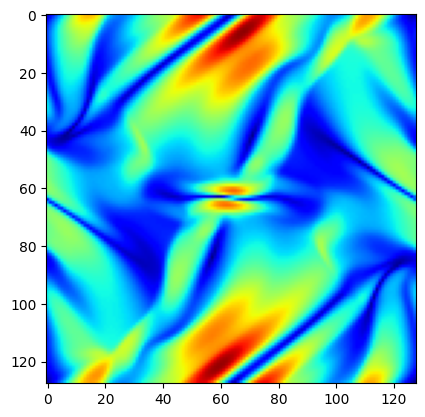

t= 0.4916  c0_max = 1.6483  cf_max = 1.9479  v_max= 1.7577  alpha= 0.7701  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4928  c0_max = 1.6477  cf_max = 1.9483  v_max= 1.7569  alpha= 0.7700  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4940  c0_max = 1.6468  cf_max = 1.9489  v_max= 1.7561  alpha= 0.7699  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4952  c0_max = 1.6458  cf_max = 1.9496  v_max= 1.7557  alpha= 0.7698  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4964  c0_max = 1.6446  cf_max = 1.9503  v_max= 1.7553  alpha= 0.7697  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4976  c0_max = 1.6432  cf_max = 1.9510  v_max= 1.7547  alpha= 0.7696  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.4988  c0_max = 1.6416  cf_max = 1.9518  v_max= 1.7541  alpha= 0.7695  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000
t= 0.5000  c0_max = 1.6397  cf_max = 1.9526  v_max= 1.7533  alpha= 0.7694  alpha1= 1.0000  |divB|= 0.0000  |Bz|= 0.0000


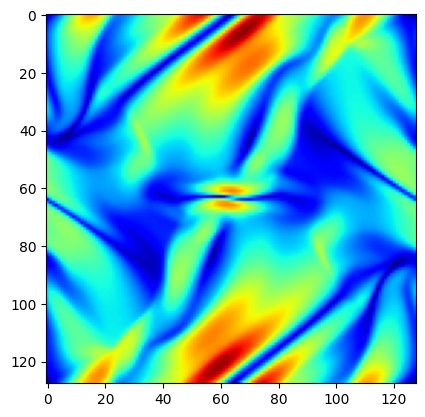

done!


In [6]:
# keep track of timesteps
dt_save = []
gamma = 5/3

# prep figure
plt.figure(figsize=(4, 4), dpi=80)
out_count = 1

# Simulation Main Loop
while t < t_end:
    # get Primitive variables
    Bx, By = get_avg(bx, by)
    rho, vx, vy, vz, P = get_primitive(
        Mass, Momx, Momy, Momz, Energy, Bx, By, Bz, gamma, vol, c_limit
    )

    # get time step (CFL) = dx / max signal speed
    # c0 = np.sqrt( gamma*(P-0.5*(Bx**2+By**2+Bz**2))/rho)
    c0 = np.sqrt(
        gamma * (np.maximum(P - 0.5 * (Bx**2 + By**2 + Bz**2), 1.0e-16)) / rho
    )
    ca = np.sqrt((Bx**2 + By**2 + Bz**2) / rho)
    cf = np.sqrt(c0**2 + ca**2)
    c0_max = np.max(c0)
    cf_max = np.max(cf)
    # alpha = np.minimum(1.0, c_limit / np.sqrt(c0**2 + ca**2))
    alpha1 = np.minimum(1.0, c_limit / np.sqrt(c0**2 + ca**2))
    alpha = 1.0 / np.sqrt(1.0 + (ca / c_limit) ** 2)
    # !!! apply boris factor to wave speeds
    cf *= alpha
    dt = courant_fac * np.min(dx / (cf + np.sqrt(vx**2 + vy**2 + vz**2)))
    v_max = np.max(np.sqrt(vx**2 + vy**2 + vz**2))

    plot_this_turn = False
    if t + dt > out_count * t_out:
        plot_this_turn = True

    # first RK stage
    (
        dudt_Mass,
        dudt_Momx,
        dudt_Momy,
        dudt_Momz,
        dudt_Energy,
        dudt_Bz,
        dudt_bx,
        dudt_by,
    ) = get_dudt(rho, vx, vy, vz, P, bx, by, Bz, dx, gamma, c_limit)

    # update solution
    Mass_1 = apply_dudt(Mass, dudt_Mass, dt)
    Momx_1 = apply_dudt(Momx, dudt_Momx, dt)
    Momy_1 = apply_dudt(Momy, dudt_Momy, dt)
    Momz_1 = apply_dudt(Momz, dudt_Momz, dt)
    Energy_1 = apply_dudt(Energy, dudt_Energy, dt)
    Bz_1 = apply_dudt(Bz, dudt_Bz, dt)
    bx_1 = apply_dudt(bx, dudt_bx, dt)
    by_1 = apply_dudt(by, dudt_by, dt)

    # start accumulating the n+1 result u^n+1 = [u^n + dt/2 L(u^n)] + dt/2 L(u^1)
    Mass = apply_dudt(Mass, dudt_Mass, 0.5 * dt)
    Momx = apply_dudt(Momx, dudt_Momx, 0.5 * dt)
    Momy = apply_dudt(Momy, dudt_Momy, 0.5 * dt)
    Momz = apply_dudt(Momz, dudt_Momz, 0.5 * dt)
    Energy = apply_dudt(Energy, dudt_Energy, 0.5 * dt)
    Bz = apply_dudt(Bz, dudt_Bz, 0.5 * dt)
    bx = apply_dudt(bx, dudt_bx, 0.5 * dt)
    by = apply_dudt(by, dudt_by, 0.5 * dt)

    # second stage
    Bx, By = get_avg(bx_1, by_1)
    rho, vx, vy, vz, P = get_primitive(
        Mass_1, Momx_1, Momy_1, Momz_1, Energy_1, Bx, By, Bz_1, gamma, vol, c_limit
    )
    (
        dudt_Mass,
        dudt_Momx,
        dudt_Momy,
        dudt_Momz,
        dudt_Energy,
        dudt_Bz,
        dudt_bx,
        dudt_by,
    ) = get_dudt(rho, vx, vy, vz, P, bx_1, by_1, Bz, dx, gamma, c_limit)

    Mass = apply_dudt(Mass, dudt_Mass, 0.5 * dt)
    Momx = apply_dudt(Momx, dudt_Momx, 0.5 * dt)
    Momy = apply_dudt(Momy, dudt_Momy, 0.5 * dt)
    Momz = apply_dudt(Momz, dudt_Momz, 0.5 * dt)
    Energy = apply_dudt(Energy, dudt_Energy, 0.5 * dt)
    Bz = apply_dudt(Bz, dudt_Bz, 0.5 * dt)
    bx = apply_dudt(bx, dudt_bx, 0.5 * dt)
    by = apply_dudt(by, dudt_by, 0.5 * dt)

    # update time
    t += dt

    # save timestep
    dt_save.append(dt)

    # check div B
    divB = get_div(bx, by, dx)
    print(
        "t=",
        f"{t:.4f}",
        " c0_max =",
        f"{c0_max:.4f}",
        " cf_max =",
        f"{cf_max:.4f}",
        " v_max=",
        f"{v_max:.4f}",
        " alpha=",
        f"{np.min(alpha):.4f}",
        " alpha1=",
        f"{np.min(alpha1):.4f}",
        " |divB|=",
        f"{np.mean(np.abs(divB)):.4f}",
        " |Bz|=",
        f"{np.mean(np.abs(Bz)):.4f}",
    )

    # plot in real time
    if (plot_in_real_time and plot_this_turn) or (t >= t_end):
        plt.cla()
        # plt.imshow(rho.T, cmap='jet')
        # plt.clim(0.06, 0.5)
        if True:
            plt.imshow(np.sqrt(bx**2 + by**2).T, cmap="jet")
            plt.clim(0.0, 0.8)
     
        ax = plt.gca()
        plt.pause(0.001)
        out_count += 1

print("done!")

prefix = "output/p" + str(prob_id) + "_"
if False:

    # Save figure
    plt.savefig(prefix + "P_B_" + str(c_limit) + ".png", dpi=240)
    # plt.show()
    
    # Save rho, P_B, v, vA, cf, and dt_save
    Bx, By = get_avg(bx, by)
    rho, vx, vy, vz, P = get_primitive(
        Mass, Momx, Momy, Momz, Energy, Bx, By, Bz, gamma, vol, c_limit
    )
    P_B = 0.5 * np.sqrt(Bx**2 + By**2 + Bz**2)
    v = np.sqrt(vx**2 + vy**2 + vz**2)
    # c0 = np.sqrt( gamma*(P-0.5*(Bx**2+By**2+Bz**2))/rho )
    c0 = np.sqrt(gamma * (np.maximum(P - 0.5 * (Bx**2 + By**2 + Bz**2), 1.0e-16)) / rho)
    ca = np.sqrt((Bx**2 + By**2 + Bz**2) / rho)
    cf = np.sqrt(c0**2 + ca**2)
    np.save(prefix + "data_rho_" + str(c_limit) + ".npy", rho.T)
    np.save(prefix + "data_P_B_" + str(c_limit) + ".npy", P_B.T)
    np.save(prefix + "data_Bz_" + str(c_limit) + ".npy", Bz.T)
    np.save(prefix + "data_v_" + str(c_limit) + ".npy", v.T)
    np.save(prefix + "data_ca_" + str(c_limit) + ".npy", ca.T)
    np.save(prefix + "data_cf_" + str(c_limit) + ".npy", cf.T)
    np.save(prefix + "data_dt_" + str(c_limit) + ".npy", dt_save)


In [45]:
import os
import sys
sys.path.append("../../")
import os

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"
#os.environ["JAX_PLATFORMS"] = "cuda"  # or: os.environ["JAX_PLATFORM_NAME"]="cuda"
#using GPU, comment out if on CPU?
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = ''
import jax
jax.config.update("jax_disable_jit", False)

jax.config.update("jax_debug_nans", True)

In [46]:
IC = np.array([rho, vx, vy, vz, Bx, By, Bz,P])

In [47]:
IC = IC.reshape(8,128,128,1)

In [48]:
import diffhydro as dh

In [49]:
eq = dh.equationmanager_mhd.EquationManagerMHD()

In [50]:

eq.gamma = 5/3

#not sure why CFL has to be so low...
eq.cfl= 0.4
#solver = dh.HLL_MHD(equation_manager=eq,signal_speed=None)
solver = dh.HLLD_MHD(equation_manager=eq)  # or HLL_MHD
cf = dh.ConvectiveFlux(eq,solver,dh.MUSCL3(limiter="IDENTITY"),positivity=True)


In [51]:
IC_con = eq.get_conservatives_from_primitives(IC)

In [54]:
import jax.numpy as jnp
from typing import Callable

Array = jnp.ndarray

def _minmod3(a: Array, b: Array, c: Array) -> Array:
    """Minmod of three arrays (returns 0 if signs disagree)."""
    sa, sb, sc = jnp.sign(a), jnp.sign(b), jnp.sign(c)
    same = (sa == sb) & (sa == sc)
    m = jnp.minimum(jnp.abs(a), jnp.minimum(jnp.abs(b), jnp.abs(c)))
    return jnp.where(same, sa * m, 0.0)

class PLM_BORIS:
    """
    BORIS-style PLM reconstruction:
      - compute centered slope dq_c = 0.5*(q_{i+1} - q_{i-1})
      - limit slope by clamping against one-sided deltas (minmod-like)
      - extrapolate to faces
    """
    def __init__(self):
        pass

    def _limited_slope(self, q: Array, axis: int) -> Array:
        q_im1 = jnp.roll(q,  1, axis=axis)
        q_ip1 = jnp.roll(q, -1, axis=axis)

        dqm = q - q_im1                  # Δ-  = q_i - q_{i-1}
        dqp = q_ip1 - q                  # Δ+  = q_{i+1} - q_i
        dqcen = 0.5 * (q_ip1 - q_im1)    # centered slope (in "dq" units)

        # BORIS limiter effect: clamp centered slope to not exceed one-sided deltas
        return _minmod3(dqcen, dqm, dqp)

    def reconstruct_xi(self, buffer: Array, axis: int, j: int = None) -> Array:
        """
        Returns the state on the i+1/2 face.
        j=0 -> left state at i+1/2:  q_L = q_i   + 0.5 * dq_i
        j=1 -> right state at i+1/2: q_R = q_{i+1} - 0.5 * dq_{i+1}
        """
        dq = self._limited_slope(buffer, axis=axis)

        if j == 0:  # left state at i+1/2
            return buffer + 0.5 * dq

        if j == 1:  # right state at i+1/2 uses cell i+1 data
            buffer_ip1 = jnp.roll(buffer, -1, axis=axis)
            dq_ip1 = jnp.roll(dq, -1, axis=axis)
            return buffer_ip1 - 0.5 * dq_ip1

        raise ValueError("j must be 0 (left) or 1 (right)")

In [119]:
eq.cfl=0.4
solver = dh.LaxFriedrichs_MHD(equation_manager=eq,signal_speed=None)  # or HLL_MHD

cf = dh.ConvectiveFlux(eq,solver,PLM_BORIS(),positivity=False)

#dh.MUSCL3(limiter=key)

hydro_baseline = dh.hydro(n_super_step=700,#730, 
                             fluxes=[cf],
                             forces=[],
                             use_mol=True,
                             use_ct=True, 
                             integrator="RK2") 


output_baseline = hydro_baseline.evolve(IC_con,{})

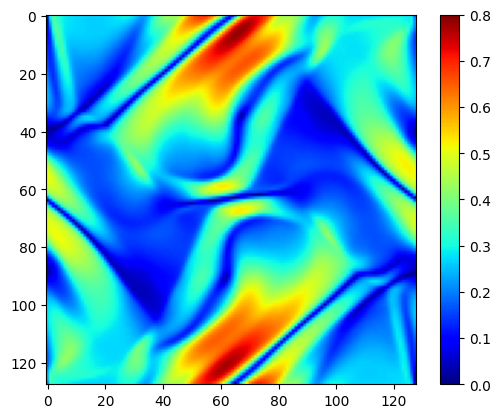

In [120]:
imshow(np.sqrt(output_baseline[0][4,:,:,0]**2+output_baseline[0][5,:,:,0]**2).T,cmap="jet")
plt.clim(0.0, 0.8)
colorbar()

In [ ]:
#looks not terrible, although still not really what the other code says...

In [121]:
def divB(U):
    Bx, By, Bz = U[4], U[5], U[6]
    dx = 1
    return ((Bx - jnp.roll(Bx, 1, axis=0)) +
            (By - jnp.roll(By, 1, axis=1)) +
            (Bz - jnp.roll(Bz, 1, axis=2))) / dx


In [122]:
divB(output_baseline[0]).shape

(128, 128, 1)

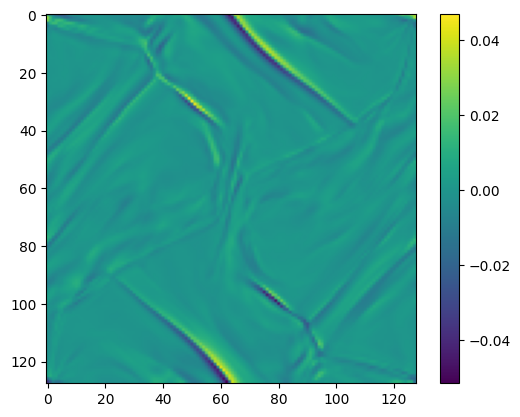

In [123]:
plt.imshow(divB(output_baseline[0])[:,:,0])
colorbar()

In [124]:
#still lots of divergence! :'(

In [125]:
#lets see if divergence explodes at some point...
hydro_baseline = dh.hydro(n_super_step=2730, 
                             fluxes=[cf],
                             forces=[],
                             use_mol=True,
                             use_ct=True, 
                             integrator="RK2") 


output_baseline = hydro_baseline.evolve(IC_con,{})

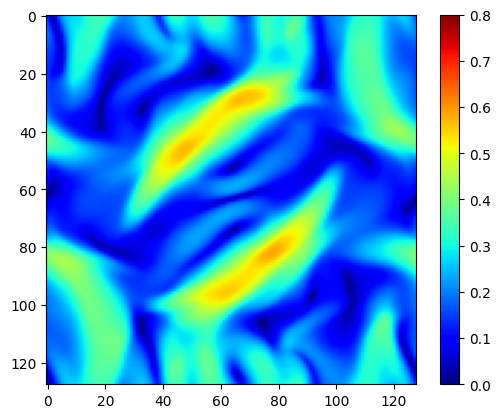

In [126]:
imshow(np.sqrt(output_baseline[0][4,:,:,0]**2+output_baseline[0][5,:,:,0]**2).T,cmap="jet")
plt.clim(0.0, 0.8)
colorbar()

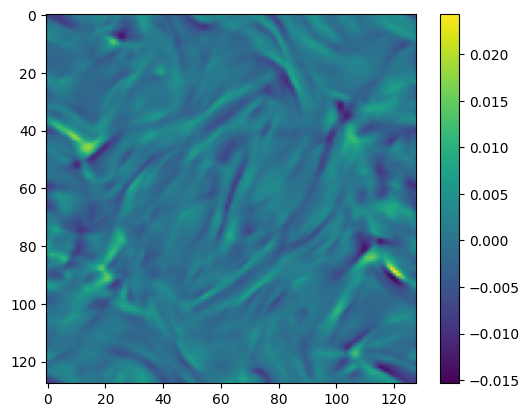

In [127]:
plt.imshow(divB(output_baseline[0])[:,:,0])
colorbar()

In [ ]:
#nothing crazy?